## Random Forest - Chronic Kidney disease with Covid-19

In this research we are trying to eastablish the relation of morbidity and mortality in Choric kidney disease patients infected with COVID-19

<hr>

### Data Understanding and Cleaning

In [1]:
# Importing the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:

import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import confusion_matrix,accuracy_score

from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [3]:
def get_dataset_shape(inputDataFrame):
    dataframe_shape = inputDataFrame.shape
    print ("There are {0} rows and {1} columns".format(dataframe_shape[0], dataframe_shape[1]))


def get_missing_values(inputDataFrame):
    df_missing = pd.concat([
        inputDataFrame.isnull().sum(), 
        round((inputDataFrame.isnull().sum() / len(inputDataFrame)) * 100, 2)
    ], axis=1)
    df_missing = df_missing.rename(columns = {
        0 : 'Missing Values',
        1 : '% of Missing Values'
    })
    df_missing['Data Type'] = inputDataFrame.dtypes
    df_missing = df_missing[df_missing['Missing Values'] > 0]
    df_missing = df_missing.sort_values(by='% of Missing Values', ascending=False)
    print ("{0} columns have missing values".format(df_missing.shape[0]))
    return df_missing


def calculate_model_accurach(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    print(cm)
    TN = cm[0,0]
    FP = cm[0,1]
    FN = cm[1,0]
    TP = cm[1,1]
    print("Precision: {0}".format(round(TP/(TP+FP)),2))
    print("Sensitivity: {0}".format(round(TP/(TP+FN),2)))
    print("Specificity: {0}".format(round(TN/(TN+FP),2)))
    print("Accuracy: {0}".format(round(accuracy_score(y_test,y_pred),2)))

In [4]:
# Reading the xls file and putting it into 'df' object.
file =('COVID-19-dataset.xlsx')
sheet1 = pd.read_excel(file, 
                        sheet_name = 0, 
                        index_col = 0)
  
sheet2 = pd.read_excel(file, 
                        sheet_name = 1, 
                        index_col = 0)

In [5]:
sheet1.columns

Index(['Ward of admission', 'Outcome', 'Date of admission',
       'Date of discharge', 'Hospital stay (days)', 'Age', 'Gender', 'HTN',
       'DM', 'IHD', 'CVA', 'Respiratory illness',
       'Symptoms at admission (attributable to COVID)',
       'Duration of symptoms before admission (days)', 'Fever', 'Cough',
       'Breathlessness', 'Vomiting', 'Diarrhoea', 'Sepsis',
       'Shock at admission', 'Shock during stay', 'CNS involvement',
       'Liver involvement', 'HypoxiaAtAdmi',
       'Best maintained sPO2 at admission', 'O2 Requirement at admission*',
       'Maximum O2 Requirement during stay*', 'Duration of O2 Requirement',
       'COVID stage at admission', 'Worst COVID stage', 'Heart Rate',
       'Systolic Blood Pressure', 'Diastolic Blood Pressure', 'BUN',
       'Creatinine', 'Sodium', 'Potassium', 'Haemoglobin at admission',
       'Total leucocyte count at admission', 'Platelet count at admission',
       'SGOT', 'SGPT', 'Blood sugar control during stay', 'PCV Transfusi

In [6]:
sheet2.columns

Index(['Ward of admission', 'Outcome', 'Date of admission',
       'Date of discharge', 'Hospital stay (days)', 'Age', 'Gender', 'HTN',
       'DM', 'IHD', 'CVA', 'Respiratory illness', 'Symptoms at admission',
       'Duration of symptoms before admission (days)', 'Fever', 'Cough',
       'Breathlessness', 'Vomiting', 'Diarrhoea', 'Sepsis at admission',
       'Shock at admission', 'Shock during stay', 'CNS involvement',
       'Liver Involvement', 'HypoxiaAtAdmi',
       'Best maintained sPO2 at admission', 'O2 requirement  at admission*',
       'Maximum O2 Requirement*', 'Duration of O2 requirement (Days)',
       'COVID stage at admission',
       'Most severe COVID stage during hospitalization', 'Heart Rate ',
       'Systolic Blood Pressure', 'Diastolic Blood Pressure', 'BUN',
       'Creatinine', 'Sodium', 'Potassium', 'Haemoglobin',
       'Total leucocyte count', 'Platelet count', 'SGOT', 'SGPT',
       'Blood sugar control during stay', 'PCV Transfusion', 'Steroids',
       

### Droppin the date values

In [7]:
sheet1=sheet1[sheet1.columns[~sheet1.columns.str.contains('Date')]]

In [8]:
sheet2=sheet2[sheet2.columns[~sheet2.columns.str.contains('Date')]]

In [9]:
sheet1.columns

Index(['Ward of admission', 'Outcome', 'Hospital stay (days)', 'Age', 'Gender',
       'HTN', 'DM', 'IHD', 'CVA', 'Respiratory illness',
       'Symptoms at admission (attributable to COVID)',
       'Duration of symptoms before admission (days)', 'Fever', 'Cough',
       'Breathlessness', 'Vomiting', 'Diarrhoea', 'Sepsis',
       'Shock at admission', 'Shock during stay', 'CNS involvement',
       'Liver involvement', 'HypoxiaAtAdmi',
       'Best maintained sPO2 at admission', 'O2 Requirement at admission*',
       'Maximum O2 Requirement during stay*', 'Duration of O2 Requirement',
       'COVID stage at admission', 'Worst COVID stage', 'Heart Rate',
       'Systolic Blood Pressure', 'Diastolic Blood Pressure', 'BUN',
       'Creatinine', 'Sodium', 'Potassium', 'Haemoglobin at admission',
       'Total leucocyte count at admission', 'Platelet count at admission',
       'SGOT', 'SGPT', 'Blood sugar control during stay', 'PCV Transfusion',
       'Steroids', 'Heparin', 'HCQS', 'Antiv

In [10]:
sheet2.columns

Index(['Ward of admission', 'Outcome', 'Hospital stay (days)', 'Age', 'Gender',
       'HTN', 'DM', 'IHD', 'CVA', 'Respiratory illness',
       'Symptoms at admission', 'Duration of symptoms before admission (days)',
       'Fever', 'Cough', 'Breathlessness', 'Vomiting', 'Diarrhoea',
       'Sepsis at admission', 'Shock at admission', 'Shock during stay',
       'CNS involvement', 'Liver Involvement', 'HypoxiaAtAdmi',
       'Best maintained sPO2 at admission', 'O2 requirement  at admission*',
       'Maximum O2 Requirement*', 'Duration of O2 requirement (Days)',
       'COVID stage at admission',
       'Most severe COVID stage during hospitalization', 'Heart Rate ',
       'Systolic Blood Pressure', 'Diastolic Blood Pressure', 'BUN',
       'Creatinine', 'Sodium', 'Potassium', 'Haemoglobin',
       'Total leucocyte count', 'Platelet count', 'SGOT', 'SGPT',
       'Blood sugar control during stay', 'PCV Transfusion', 'Steroids',
       'Heparin', 'HCQS', 'Antiviral', 'RenalOutcome',
 

### Dropping the data at tail which is irrelavant

In [11]:
sheet1.drop(sheet1.tail(1).index,
        inplace = True)
sheet2.drop(sheet2.tail(1).index,
        inplace = True)

In [12]:
sheet1.tail()

,Ward of admission,Outcome,Hospital stay (days),Age,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,O2 Requirement at admission*,Maximum O2 Requirement during stay*,Duration of O2 Requirement,COVID stage at admission,Worst COVID stage,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGOT,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Last HD session (Days ago),Access,Frequency of MHD/week,Dialysis Vintage (months),Sepsis during hospital stay,Diarrhoea during hospital stay,Dialysis Vintage Category
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
114.0,HDRU,Survived,16.0,82.0,Male,Present,No,No,No,No,Present,1.0,No,Present,Present,No,No,No,No,No,No,No,Present,88.0,3,3.0,9.0,1.0,1.0,90.0,130.0,90.0,69.0,9.2,134.0,5.3,13.6,5500.0,240.0,26.0,17.0,Controlled,Not Required,Required,Required,Not Required,Given,1.0,Fistula,3 times / week,18.0,Absent,Absent,> 12 months
115.0,HDRU,Survived,22.0,46.0,Female,Present,No,No,No,No,Present,10.0,Present,No,No,No,No,No,No,No,No,No,No,96.0,0,0.0,0.0,0.0,0.0,86.0,136.0,84.0,62.0,8.0,130.0,6.8,5.5,9200.0,220.0,23.0,22.0,Controlled,Not Required,Not Required,Not Required,Not Required,Not Given,2.0,TCC,3 times / week,12.0,Absent,Absent,< 12 Months
116.0,HDRU,Survived,NaN,34.0,Male,Present,Present,No,No,No,Present,7.0,Present,No,Present,Present,No,No,No,No,No,No,No,98.0,0,0.0,0.0,0.0,0.0,86.0,150.0,90.0,28.0,6.2,130.0,4.9,11.9,6500.0,380.0,26.0,11.0,Controlled,Not Required,Not Required,Not Required,Not Required,Not Given,3.0,Fistula,3 times / week,3.0,Absent,Absent,< 12 Months
117.0,Intensive care unit,Death,2.0,44.0,Male,Present,Present,No,No,Present,Present,15.0,No,No,No,No,No,No,No,No,Present,No,No,98.0,0,0.0,0.0,0.0,0.0,80.0,140.0,90.0,74.0,9.0,142.0,5.2,9.7,11800.0,280.0,82.0,48.0,Controlled,Not Required,Not Required,Not Required,Not Required,Not Given,5.0,Temp Cath,3 times / week,3.0,Absent,Absent,< 12 Months
118.0,Intensive care unit,Death,4.0,75.0,Male,No,No,No,No,No,Present,1.0,No,No,Present,No,No,No,No,No,No,No,Present,86.0,3,3.0,NaN,1.0,1.0,84.0,110.0,70.0,45.0,8.5,137.0,4.5,8.8,9000.0,250.0,NaN,NaN,Controlled,Not Required,Required,Required,Not Required,Given,1.0,Fistula,< 3 times/Week,5.0,Absent,Absent,< 12 Months


In [13]:
sheet2.tail()

,Ward of admission,Outcome,Hospital stay (days),Age,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,O2 requirement at admission*,Maximum O2 Requirement*,Duration of O2 requirement (Days),COVID stage at admission,Most severe COVID stage during hospitalization,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGOT,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,RenalOutcome,Underlying Chronic Kidney Disease,Oliguria,Dura Fever cat
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
112.0,Intensive care unit,Survived,4.0,63.0,Male,Present,No,No,No,No,Present,3.0,Present,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,98.0,0,0.0,0.0,0.0,0.0,98.0,150.0,90.0,NaN,NaN,140.0,3.6,NaN,NaN,NaN,NaN,NaN,Controlled,Not Required,Not Required,Not Required,Not Required,Not Required,Discharge on Dialysis,Present,Absent,1-3 days
113.0,Intensive care unit,Death,3.0,62.0,Female,No,Present,No,Present,No,Present,15.0,Present,Absent,Present,Absent,Present,Absent,Absent,Absent,Absent,Absent,Present,80.0,2,5.0,4.0,1.0,1.0,110.0,160.0,90.0,58.0,7.7,134.0,4.9,9.0,10400.0,170.0,NaN,NaN,Uncontrolled,Not Required,Required,Not Required,Not Required,Not Required,Not applicable,Present,Absent,>= 7 Day
114.0,Intensive care unit,Death,2.0,50.0,Male,Present,No,No,No,No,Present,10.0,Present,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Present,Absent,Absent,60.0,0,3.0,2.0,0.0,1.0,92.0,160.0,100.0,52.3,7.7,138.0,7.5,11.1,16300.0,180.0,29.0,28.0,Controlled,Not Required,Required,Not Required,Not Required,Not Required,Not applicable,Present,Absent,>= 7 Day
115.0,HDRU,Survived,13.0,55.0,Male,No,No,No,No,No,Present,8.0,Present,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,98.0,0,0.0,0.0,0.0,0.0,84.0,140.0,80.0,56.3,9.2,133.0,6.2,15.5,4500.0,100.0,49.0,118.0,Controlled,Not Required,Not Required,Not Required,Not Required,Not Required,Discharge on Dialysis,Present,Absent,>= 7 Day
116.0,Intensive care unit,Death,11.0,80.0,Male,Present,Present,No,No,No,Present,5.0,Present,Present,Present,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Present,60.0,5,5.0,5.0,1.0,1.0,112.0,126.0,89.0,45.2,4.0,134.0,5.3,11.8,13800.0,179.0,52.0,39.0,Controlled,Not Required,Required,Required,Not Required,Required,Not applicable,Absent,Present,4-6 days


In [14]:
df_aki = sheet1.copy(deep=True)
df_ckdcovid = sheet2.copy(deep=True)

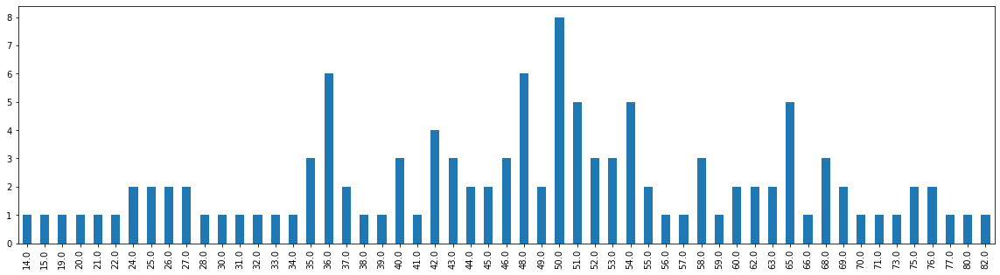

In [15]:
plt.figure(figsize = (20, 5))
sheet1.Age.value_counts().sort_index().plot(kind="bar")

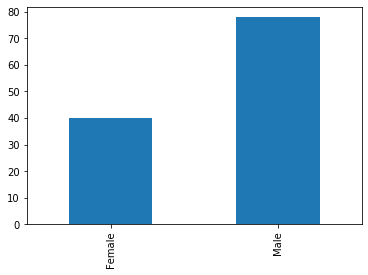

In [16]:
#plt.figure(figsize = (20, 5))
sheet1.Gender.value_counts().sort_index().plot(kind="bar")

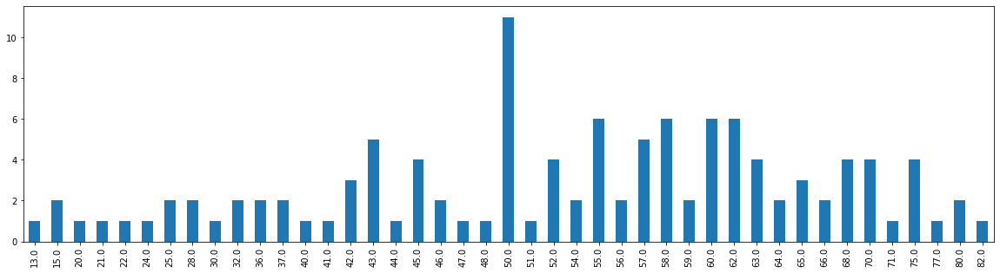

In [17]:
plt.figure(figsize = (20, 5))
sheet2.Age.value_counts().sort_index().plot(kind="bar")

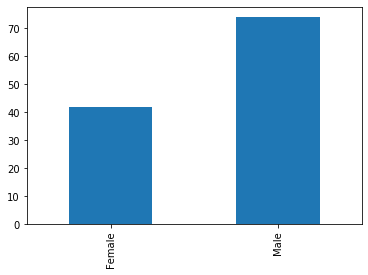

In [18]:
#plt.figure(figsize = (20, 5))
sheet2.Gender.value_counts().sort_index().plot(kind="bar")

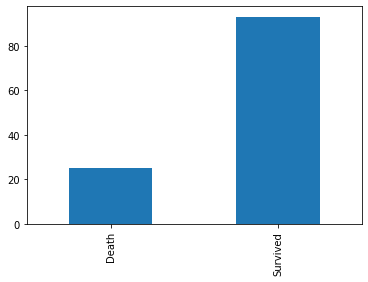

In [19]:
sheet1.Outcome.value_counts().sort_index().plot(kind="bar")

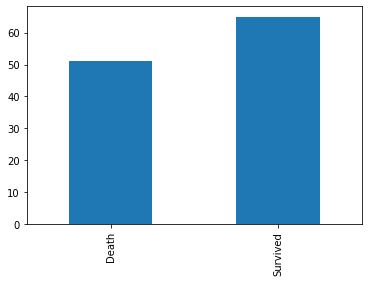

In [20]:
sheet2.Outcome.value_counts().sort_index().plot(kind="bar")

In [21]:
df_aki.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 118 entries, 1.0 to 118.0
Data columns (total 54 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Ward of admission                              118 non-null    object 
 1   Outcome                                        118 non-null    object 
 2   Hospital stay (days)                           117 non-null    float64
 3   Age                                            118 non-null    float64
 4   Gender                                         118 non-null    object 
 5   HTN                                            118 non-null    object 
 6   DM                                             118 non-null    object 
 7   IHD                                            118 non-null    object 
 8   CVA                                            118 non-null    object 
 9   Respiratory illness                            1

In [22]:
df_ckdcovid.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 116 entries, 1.0 to 116.0
Data columns (total 51 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Ward of admission                               116 non-null    object 
 1   Outcome                                         116 non-null    object 
 2   Hospital stay (days)                            115 non-null    float64
 3   Age                                             116 non-null    float64
 4   Gender                                          116 non-null    object 
 5   HTN                                             116 non-null    object 
 6   DM                                              116 non-null    object 
 7   IHD                                             116 non-null    object 
 8   CVA                                             116 non-null    object 
 9   Respiratory illness                  

In [23]:
df_aki['O2 Requirement at admission*']=df_aki['O2 Requirement at admission*'].astype('float64')
df_ckdcovid['O2 requirement  at admission*']=df_ckdcovid['O2 requirement  at admission*'].astype('float64')

In [24]:
df_aki.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 118 entries, 1.0 to 118.0
Data columns (total 54 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Ward of admission                              118 non-null    object 
 1   Outcome                                        118 non-null    object 
 2   Hospital stay (days)                           117 non-null    float64
 3   Age                                            118 non-null    float64
 4   Gender                                         118 non-null    object 
 5   HTN                                            118 non-null    object 
 6   DM                                             118 non-null    object 
 7   IHD                                            118 non-null    object 
 8   CVA                                            118 non-null    object 
 9   Respiratory illness                            1

In [25]:
df_ckdcovid.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 116 entries, 1.0 to 116.0
Data columns (total 51 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Ward of admission                               116 non-null    object 
 1   Outcome                                         116 non-null    object 
 2   Hospital stay (days)                            115 non-null    float64
 3   Age                                             116 non-null    float64
 4   Gender                                          116 non-null    object 
 5   HTN                                             116 non-null    object 
 6   DM                                              116 non-null    object 
 7   IHD                                             116 non-null    object 
 8   CVA                                             116 non-null    object 
 9   Respiratory illness                  

In [26]:
df_aki.describe()

,Hospital stay (days),Age,Duration of symptoms before admission (days),Best maintained sPO2 at admission,O2 Requirement at admission*,Maximum O2 Requirement during stay*,Duration of O2 Requirement,COVID stage at admission,Worst COVID stage,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGOT,SGPT,Last HD session (Days ago),Dialysis Vintage (months)
count,117.000000,118.000000,118.000000,117.00000,118.000000,118.000000,117.000000,118.000000,118.000000,118.000000,118.000000,118.000000,105.000000,111.000000,91.000000,107.000000,112.000000,111.000000,111.000000,108.000000,108.000000,113.000000,105.000000
mean,16.914530,48.211864,4.466102,93.17094,1.016949,1.610169,5.111111,0.415254,0.559322,91.966102,132.338983,81.830508,60.060952,9.603694,132.054945,5.041682,8.608929,9107.837838,196.306306,62.660185,57.397222,4.159292,30.838095
std,12.167348,15.204504,4.260096,7.62289,1.267497,1.569114,7.615522,0.494867,0.498586,11.733459,25.228942,13.881861,34.992069,4.184563,5.598338,1.046926,2.335683,5206.913307,86.507256,245.810375,225.019355,5.147063,38.148022
min,1.000000,14.000000,0.000000,63.00000,0.000000,0.000000,0.000000,0.000000,0.000000,68.000000,80.000000,50.000000,17.000000,3.000000,120.000000,3.000000,4.700000,1900.000000,60.000000,13.000000,5.000000,0.000000,3.000000
25%,10.000000,37.000000,2.000000,89.00000,0.000000,0.000000,0.000000,0.000000,0.000000,84.000000,114.500000,70.000000,40.000000,6.900000,129.000000,4.150000,6.800000,5500.000000,120.000000,24.000000,11.000000,2.000000,6.000000
50%,14.000000,49.500000,4.000000,97.00000,0.000000,2.000000,2.000000,0.000000,1.000000,90.000000,130.000000,80.000000,54.000000,8.700000,132.000000,5.000000,8.500000,7700.000000,180.000000,32.500000,18.500000,3.000000,18.000000
75%,19.000000,58.000000,7.000000,98.00000,2.000000,3.000000,8.000000,1.000000,1.000000,98.000000,140.000000,90.000000,70.900000,11.000000,135.000000,5.900000,10.225000,12000.000000,250.000000,44.250000,29.000000,4.000000,36.000000
max,79.000000,82.000000,30.000000,100.00000,4.000000,4.000000,40.000000,1.000000,1.000000,130.000000,220.000000,120.000000,233.000000,25.000000,145.000000,7.700000,16.300000,27800.000000,429.000000,2577.000000,2188.000000,30.000000,216.000000


In [27]:
df_ckdcovid.describe()

,Hospital stay (days),Age,Duration of symptoms before admission (days),Best maintained sPO2 at admission,O2 requirement at admission*,Maximum O2 Requirement*,Duration of O2 requirement (Days),COVID stage at admission,Most severe COVID stage during hospitalization,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGOT,SGPT
count,115.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,116.000000,101.000000,115.000000,115.000000,116.000000,114.000000,113.000000,113.000000,107.000000,107.000000
mean,16.669565,52.586207,6.939655,90.853448,1.396552,2.224138,5.681034,0.474138,0.681034,92.181034,130.318966,80.594828,85.849505,9.870435,131.486957,4.889655,8.650000,12009.646018,214.495575,36.822430,32.015888
std,12.769702,14.806032,6.991036,12.462294,1.598256,1.837230,6.464080,0.501497,0.468098,15.772072,23.982820,13.007007,56.271472,6.456286,7.032962,1.093330,2.705558,8366.359501,107.098180,27.201836,38.017328
min,1.000000,13.000000,0.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,60.000000,70.000000,46.000000,17.000000,1.100000,107.000000,2.900000,3.400000,2600.000000,20.000000,10.000000,5.000000
25%,8.000000,44.750000,3.000000,88.000000,0.000000,0.000000,0.000000,0.000000,0.000000,84.000000,110.000000,70.000000,54.900000,6.445000,128.000000,4.000000,6.625000,6800.000000,140.000000,21.000000,12.000000
50%,13.000000,55.000000,5.000000,96.000000,0.000000,3.000000,4.500000,0.000000,1.000000,90.000000,130.000000,80.000000,69.700000,8.900000,132.000000,4.600000,8.650000,9600.000000,200.000000,28.000000,20.000000
75%,21.000000,62.000000,8.000000,98.000000,3.000000,4.000000,8.000000,1.000000,1.000000,98.000000,150.000000,90.000000,97.000000,11.250000,136.000000,5.600000,10.550000,13800.000000,270.000000,42.000000,34.000000
max,71.000000,82.000000,45.000000,99.000000,5.000000,5.000000,36.000000,1.000000,1.000000,180.000000,190.000000,110.000000,300.000000,45.000000,156.000000,8.100000,16.700000,46000.000000,800.000000,152.000000,219.000000


In [28]:
df_aki_num=df_aki.select_dtypes(include=['float64'])

In [29]:
#Calculate Missing Values
df_aki_missing = get_missing_values(df_aki)
df_aki_missing.head(len(df_aki_missing))

24 columns have missing values


,Missing Values,% of Missing Values,Data Type
Sodium,27,22.88,float64
Dialysis Vintage Category,13,11.02,object
Dialysis Vintage (months),13,11.02,float64
BUN,13,11.02,float64
Potassium,11,9.32,float64
SGPT,10,8.47,float64
SGOT,10,8.47,float64
Creatinine,7,5.93,float64
Total leucocyte count at admission,7,5.93,float64
Platelet count at admission,7,5.93,float64


In [30]:
df_aki_missing.index

Index(['Sodium', 'Dialysis Vintage Category', 'Dialysis Vintage (months)',
       'BUN', 'Potassium', 'SGPT', 'SGOT', 'Creatinine',
       'Total leucocyte count at admission', 'Platelet count at admission',
       'Haemoglobin at admission', 'Last HD session (Days ago)',
       'Frequency of MHD/week', 'PCV Transfusion', 'Heparin', 'HCQS',
       'Steroids', 'Duration of O2 Requirement', 'Antiviral',
       'Best maintained sPO2 at admission', 'Access', 'CNS involvement',
       'Liver involvement', 'Hospital stay (days)'],
      dtype='object')

In [31]:
df_aki[df_aki_num.columns] = df_aki[df_aki_num.columns].fillna(df_aki[df_aki_num.columns].mean())

In [32]:
df_aki=df_aki.apply(lambda x: x.fillna(x.value_counts().index[0]))

In [33]:
#Calculate Missing Values
df_aki_missing = get_missing_values(df_aki)
df_aki_missing.head(len(df_aki_missing))

0 columns have missing values


,Missing Values,% of Missing Values,Data Type


In [34]:
df_aki_cat=df_aki.select_dtypes(include=['object'])
df_aki_cat.head()

,Ward of admission,Outcome,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Access,Frequency of MHD/week,Sepsis during hospital stay,Diarrhoea during hospital stay,Dialysis Vintage Category
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Pre- HDRU,Survived,Male,Present,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Controlled,Not Required,Not Required,Not Required,Required,Not Given,Fistula,< 3 times/Week,Absent,Present,> 12 months
2.0,Pre- HDRU,Death,Male,No,No,No,No,No,Present,Present,No,No,Present,Present,No,No,Present,No,No,Present,Controlled,Not Required,Not Required,Required,Required,Not Given,Fistula,3 times / week,Absent,Absent,> 12 months
3.0,Pre- HDRU,Survived,Male,Present,No,Present,No,No,Present,Present,Present,No,No,No,No,No,No,No,No,No,Controlled,Not Required,Not Required,Not Required,Required,Not Given,Fistula,3 times / week,Absent,Absent,> 12 months
4.0,Pre- HDRU,Survived,Female,Present,No,No,No,Present,Present,Present,No,No,No,No,No,No,No,No,No,No,Controlled,Required,Not Required,Not Required,Required,Given,Fistula,3 times / week,Absent,Absent,> 12 months
5.0,Pre- HDRU,Survived,Female,Present,No,No,No,Present,No,No,No,No,No,No,No,No,No,No,No,No,Controlled,Not Required,Not Required,Not Required,Required,Not Given,Fistula,< 3 times/Week,Absent,Absent,< 12 Months


In [35]:
#df_ckd_num=df_ckd.select_dtypes(include=['float64'])
df_aki_num.head()

,Hospital stay (days),Age,Duration of symptoms before admission (days),Best maintained sPO2 at admission,O2 Requirement at admission*,Maximum O2 Requirement during stay*,Duration of O2 Requirement,COVID stage at admission,Worst COVID stage,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGOT,SGPT,Last HD session (Days ago),Dialysis Vintage (months)
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,
1.0,7.0,55.0,0.0,94.0,0.0,0.0,0.0,0.0,0.0,88.0,130.0,90.0,NaN,15.3,NaN,6.0,11.6,3000.0,72.0,27.0,11.0,5.0,96.0
2.0,4.0,42.0,7.0,94.0,3.0,4.0,5.0,1.0,1.0,88.0,140.0,90.0,82.0,19.2,133.0,5.7,8.2,3400.0,100.0,113.0,35.0,7.0,96.0
3.0,8.0,63.0,4.0,94.0,0.0,0.0,0.0,0.0,0.0,86.0,130.0,80.0,NaN,NaN,NaN,6.2,NaN,NaN,NaN,36.0,25.0,2.0,36.0
4.0,18.0,54.0,7.0,99.0,0.0,0.0,0.0,0.0,0.0,90.0,160.0,90.0,65.0,14.8,131.0,4.8,12.2,2700.0,100.0,25.0,10.0,3.0,18.0
5.0,5.0,27.0,0.0,99.0,0.0,0.0,0.0,0.0,0.0,98.0,130.0,90.0,NaN,8.8,NaN,NaN,9.4,8100.0,400.0,34.0,19.0,2.0,9.0


In [36]:
df_aki_cat_1=df_aki_cat[['Ward of admission', 'Gender']]
df_aki_cat_1

,Ward of admission,Gender
Sr. no.,,
1.0,Pre- HDRU,Male
2.0,Pre- HDRU,Male
3.0,Pre- HDRU,Male
4.0,Pre- HDRU,Female
5.0,Pre- HDRU,Female
6.0,Pre- HDRU,Female
7.0,Pre- HDRU,Male
8.0,Pre- HDRU,Male
9.0,Pre- HDRU,Female


In [37]:
df_aki_cat_2=df_aki_cat[df_aki_cat.columns[3:]]
df_aki_cat_2

,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Access,Frequency of MHD/week,Sepsis during hospital stay,Diarrhoea during hospital stay,Dialysis Vintage Category
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Present,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Controlled,Not Required,Not Required,Not Required,Required,Not Given,Fistula,< 3 times/Week,Absent,Present,> 12 months
2.0,No,No,No,No,No,Present,Present,No,No,Present,Present,No,No,Present,No,No,Present,Controlled,Not Required,Not Required,Required,Required,Not Given,Fistula,3 times / week,Absent,Absent,> 12 months
3.0,Present,No,Present,No,No,Present,Present,Present,No,No,No,No,No,No,No,No,No,Controlled,Not Required,Not Required,Not Required,Required,Not Given,Fistula,3 times / week,Absent,Absent,> 12 months
4.0,Present,No,No,No,Present,Present,Present,No,No,No,No,No,No,No,No,No,No,Controlled,Required,Not Required,Not Required,Required,Given,Fistula,3 times / week,Absent,Absent,> 12 months
5.0,Present,No,No,No,Present,No,No,No,No,No,No,No,No,No,No,No,No,Controlled,Not Required,Not Required,Not Required,Required,Not Given,Fistula,< 3 times/Week,Absent,Absent,< 12 Months
6.0,Present,Present,No,No,No,Present,No,No,Present,Present,No,No,No,No,No,No,No,Controlled,Required,Not Required,Not Required,Required,Not Given,Temp Cath,3 times / week,Absent,Absent,< 12 Months
7.0,Present,No,No,Present,No,Present,Present,Present,Present,No,No,No,No,No,No,No,Present,Controlled,Not Required,Not Required,Not Required,Required,Given,Fistula,3 times / week,Absent,Absent,> 12 months
8.0,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Present,Controlled,Not Required,Required,Not Required,Required,Not Given,Fistula,3 times / week,Absent,Absent,< 12 Months
9.0,Present,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Controlled,Required,Required,Not Required,Required,Not Given,TCC,3 times / week,Absent,Present,< 12 Months


In [38]:
df_aki_cat_2.describe()

,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Access,Frequency of MHD/week,Sepsis during hospital stay,Diarrhoea during hospital stay,Dialysis Vintage Category
count,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118,118
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,2,2,2,2
top,Present,No,No,No,No,Present,Present,No,Present,No,No,No,No,No,No,No,No,Controlled,Not Required,Required,Not Required,Required,Not Given,Fistula,3 times / week,Absent,Absent,> 12 months
freq,104,77,103,112,107,99,72,82,64,101,105,100,109,101,110,116,69,108,76,72,81,64,98,78,88,96,86,67


In [39]:
len(df_aki_cat_2.columns)

28

### Visualizing the data

In [40]:
df_aki_num.corr()

,Hospital stay (days),Age,Duration of symptoms before admission (days),Best maintained sPO2 at admission,O2 Requirement at admission*,Maximum O2 Requirement during stay*,Duration of O2 Requirement,COVID stage at admission,Worst COVID stage,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGOT,SGPT,Last HD session (Days ago),Dialysis Vintage (months)
Hospital stay (days),1.000000,0.103505,0.008698,0.155985,-0.045066,0.000560,0.455136,-0.034050,0.056397,-0.014496,0.105192,0.135516,-0.134583,-0.188449,0.076281,-0.008871,-0.238920,0.038686,0.003183,-0.136393,-0.136029,-0.052307,-0.130313
Age,0.103505,1.000000,0.049265,-0.235187,0.333325,0.316961,0.358830,0.366474,0.368699,-0.026836,0.066923,-0.042550,0.034759,-0.123828,-0.168326,0.026535,0.125186,0.115121,-0.040279,0.075927,0.051449,0.017302,-0.078996
Duration of symptoms before admission (days),0.008698,0.049265,1.000000,-0.018348,0.087166,0.047872,-0.051594,0.130387,0.085458,-0.046874,0.167266,0.123906,0.158326,-0.036343,-0.201267,0.115642,-0.194032,0.000151,0.023591,0.021650,0.033794,0.240293,-0.117060
Best maintained sPO2 at admission,0.155985,-0.235187,-0.018348,1.000000,-0.677527,-0.626099,-0.306976,-0.635366,-0.534289,-0.202577,0.048916,0.088430,-0.072421,0.078221,-0.240343,0.150456,-0.004633,-0.088266,-0.124804,0.050654,0.044454,0.157335,-0.096265
O2 Requirement at admission*,-0.045066,0.333325,0.087166,-0.677527,1.000000,0.746813,0.506922,0.956152,0.661106,0.143714,0.005966,-0.078528,0.124425,-0.064319,0.229409,-0.122554,0.011551,0.036195,0.074804,-0.064500,-0.039769,-0.040122,0.094559
Maximum O2 Requirement during stay*,0.000560,0.316961,0.047872,-0.626099,0.746813,1.000000,0.629394,0.738592,0.914734,0.134831,-0.060109,-0.152950,0.133000,-0.054423,0.177090,-0.006764,-0.024108,0.047145,0.037937,0.036229,0.035396,0.123335,0.210330
Duration of O2 Requirement,0.455136,0.358830,-0.051594,-0.306976,0.506922,0.629394,1.000000,0.498782,0.602871,0.150209,-0.011561,-0.074129,0.025758,-0.161528,0.133572,-0.152657,-0.114486,0.042345,0.055688,-0.050732,-0.033551,-0.034507,-0.007781
COVID stage at admission,-0.034050,0.366474,0.130387,-0.635366,0.956152,0.738592,0.498782,1.000000,0.678721,0.102539,0.009851,-0.064317,0.090882,-0.048423,0.204150,-0.163365,-0.049829,0.071355,0.047190,-0.070514,-0.055786,0.005302,0.056411
Worst COVID stage,0.056397,0.368699,0.085458,-0.534289,0.661106,0.914734,0.602871,0.678721,1.000000,0.089467,-0.019958,-0.104735,0.032636,-0.099123,0.097383,0.077683,-0.065732,0.054060,0.024644,0.091102,0.073260,0.093412,0.210726
Heart Rate,-0.014496,-0.026836,-0.046874,-0.202577,0.143714,0.134831,0.150209,0.102539,0.089467,1.000000,0.080537,0.141223,0.097718,-0.127201,0.160053,-0.094044,0.107944,0.123371,0.096137,0.076811,0.169585,-0.062546,-0.052551


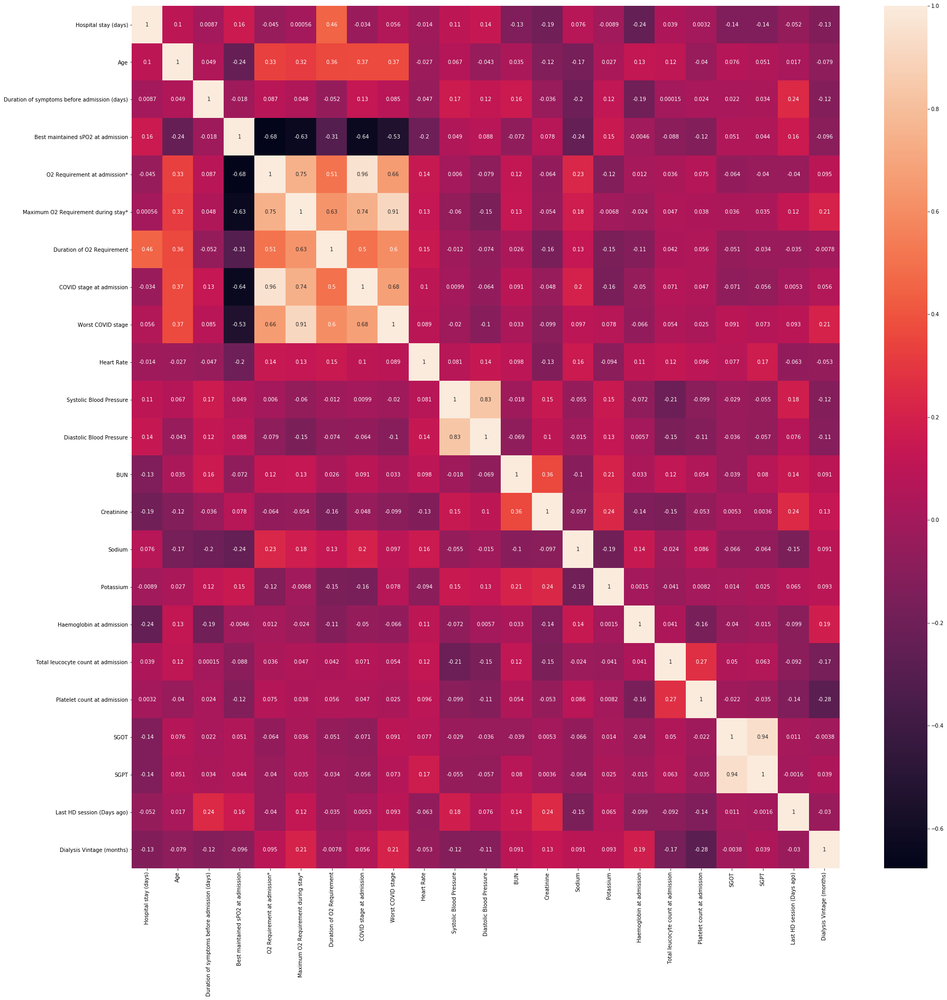

In [41]:
plt.figure(figsize = (30, 30))
#mask = np.triu(np.ones_like(df_ckd_num.corr()))
sns.heatmap(df_aki_num.corr(), annot = True)
plt.show()

### eleminating the features with correlation

In [42]:
df_aki.drop(['O2 Requirement at admission*',
       'Maximum O2 Requirement during stay*', 'Duration of O2 Requirement',
       'COVID stage at admission','Systolic Blood Pressure','SGOT'], axis=1, inplace=True)

In [43]:
df_aki_num.drop(['O2 Requirement at admission*',
       'Maximum O2 Requirement during stay*', 'Duration of O2 Requirement',
       'COVID stage at admission','Systolic Blood Pressure','SGOT'], axis=1, inplace=True)

In [44]:
def outcome_map(x):
    return x.map({'Survived':1, 'Death':0})

# Applying the function to the outcome column
df_aki[['Outcome']] = df_aki[['Outcome']].apply(outcome_map)

In [46]:
df_aki.Outcome

Sr. no.
1.0      1
2.0      0
3.0      1
4.0      1
5.0      1
6.0      1
7.0      0
8.0      1
9.0      1
10.0     1
11.0     1
12.0     1
13.0     0
14.0     1
15.0     1
16.0     1
17.0     1
18.0     1
19.0     1
20.0     1
21.0     0
22.0     1
23.0     1
24.0     0
25.0     1
26.0     1
27.0     1
28.0     1
29.0     1
30.0     1
31.0     0
32.0     1
33.0     1
34.0     1
35.0     1
36.0     1
37.0     1
38.0     0
39.0     1
40.0     1
41.0     1
42.0     1
43.0     1
44.0     1
45.0     1
46.0     1
47.0     1
48.0     1
49.0     0
50.0     0
51.0     1
52.0     1
53.0     1
54.0     1
55.0     0
56.0     0
57.0     1
58.0     1
59.0     1
60.0     1
61.0     0
62.0     0
63.0     0
64.0     1
65.0     1
66.0     1
67.0     1
68.0     1
69.0     0
70.0     1
71.0     1
72.0     0
73.0     1
74.0     1
75.0     0
76.0     1
77.0     1
78.0     1
79.0     1
80.0     1
81.0     1
82.0     1
83.0     1
84.0     1
85.0     1
86.0     1
87.0     1
88.0     1
89.0     0
90.0     1
91

In [47]:
df_aki_av = pd.get_dummies(df_aki[['Antiviral','Access','Frequency of MHD/week','Dialysis Vintage Category']], drop_first=True)
#df_aki_av
df_aki.drop(['Antiviral','Access','Frequency of MHD/week','Dialysis Vintage Category'], axis=1, inplace=True)
df_aki = pd.concat([df_aki, df_aki_av], axis=1)
df_aki.head()

,Ward of admission,Outcome,Hospital stay (days),Age,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Worst COVID stage,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Last HD session (Days ago),Dialysis Vintage (months),Sepsis during hospital stay,Diarrhoea during hospital stay,Antiviral_Not Given,Access_TCC,Access_Temp Cath,Frequency of MHD/week_< 3 times/Week,Dialysis Vintage Category_> 12 months
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Pre- HDRU,1,7.0,55.0,Male,Present,No,No,No,No,No,0.0,No,No,No,No,No,No,No,No,No,No,No,94.0,0.0,88.0,90.0,60.060952,15.300000,132.054945,6.000000,11.600000,3000.000000,72.000000,11.0,Controlled,Not Required,Not Required,Not Required,Required,5.0,96.0,Absent,Present,1,0,0,1,1
2.0,Pre- HDRU,0,4.0,42.0,Male,No,No,No,No,No,Present,7.0,Present,No,No,Present,Present,No,No,Present,No,No,Present,94.0,1.0,88.0,90.0,82.000000,19.200000,133.000000,5.700000,8.200000,3400.000000,100.000000,35.0,Controlled,Not Required,Not Required,Required,Required,7.0,96.0,Absent,Absent,1,0,0,0,1
3.0,Pre- HDRU,1,8.0,63.0,Male,Present,No,Present,No,No,Present,4.0,Present,Present,No,No,No,No,No,No,No,No,No,94.0,0.0,86.0,80.0,60.060952,9.603694,132.054945,6.200000,8.608929,9107.837838,196.306306,25.0,Controlled,Not Required,Not Required,Not Required,Required,2.0,36.0,Absent,Absent,1,0,0,0,1
4.0,Pre- HDRU,1,18.0,54.0,Female,Present,No,No,No,Present,Present,7.0,Present,No,No,No,No,No,No,No,No,No,No,99.0,0.0,90.0,90.0,65.000000,14.800000,131.000000,4.800000,12.200000,2700.000000,100.000000,10.0,Controlled,Required,Not Required,Not Required,Required,3.0,18.0,Absent,Absent,0,0,0,0,1
5.0,Pre- HDRU,1,5.0,27.0,Female,Present,No,No,No,Present,No,0.0,No,No,No,No,No,No,No,No,No,No,No,99.0,0.0,98.0,90.0,60.060952,8.800000,132.054945,5.041682,9.400000,8100.000000,400.000000,19.0,Controlled,Not Required,Not Required,Not Required,Required,2.0,9.0,Absent,Absent,1,0,0,1,0


In [48]:
df_aki_cat_2.drop(['Antiviral','Access','Frequency of MHD/week','Dialysis Vintage Category'], axis=1, inplace=True)

In [49]:
def str_map(x):
    return x.map({'Present':1, 'No':0, 'Controlled':1, 'Uncontrolled':0, 'Required':0, 'Not Required':1, 'Absent':0})

# Applying the function to the two columns
df_aki[df_aki_cat_2.columns] = df_aki[df_aki_cat_2.columns].apply(str_map)

In [50]:
df_aki[df_aki_cat_2.columns]

,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Sepsis during hospital stay,Diarrhoea during hospital stay
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,
1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,1
2.0,0,0,0,0,0,1,1,0,0,1,1,0,0,1,0,0,1,1,1,1,0,0,0,0
3.0,1,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0
4.0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0
5.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0
6.0,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0
7.0,1,0,0,1,0,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0
8.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0
9.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1


In [51]:
df_aki.head()

,Ward of admission,Outcome,Hospital stay (days),Age,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Worst COVID stage,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Last HD session (Days ago),Dialysis Vintage (months),Sepsis during hospital stay,Diarrhoea during hospital stay,Antiviral_Not Given,Access_TCC,Access_Temp Cath,Frequency of MHD/week_< 3 times/Week,Dialysis Vintage Category_> 12 months
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Pre- HDRU,1,7.0,55.0,Male,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,94.0,0.0,88.0,90.0,60.060952,15.300000,132.054945,6.000000,11.600000,3000.000000,72.000000,11.0,1,1,1,1,0,5.0,96.0,0,1,1,0,0,1,1
2.0,Pre- HDRU,0,4.0,42.0,Male,0,0,0,0,0,1,7.0,1,0,0,1,1,0,0,1,0,0,1,94.0,1.0,88.0,90.0,82.000000,19.200000,133.000000,5.700000,8.200000,3400.000000,100.000000,35.0,1,1,1,0,0,7.0,96.0,0,0,1,0,0,0,1
3.0,Pre- HDRU,1,8.0,63.0,Male,1,0,1,0,0,1,4.0,1,1,0,0,0,0,0,0,0,0,0,94.0,0.0,86.0,80.0,60.060952,9.603694,132.054945,6.200000,8.608929,9107.837838,196.306306,25.0,1,1,1,1,0,2.0,36.0,0,0,1,0,0,0,1
4.0,Pre- HDRU,1,18.0,54.0,Female,1,0,0,0,1,1,7.0,1,0,0,0,0,0,0,0,0,0,0,99.0,0.0,90.0,90.0,65.000000,14.800000,131.000000,4.800000,12.200000,2700.000000,100.000000,10.0,1,0,1,1,0,3.0,18.0,0,0,0,0,0,0,1
5.0,Pre- HDRU,1,5.0,27.0,Female,1,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,99.0,0.0,98.0,90.0,60.060952,8.800000,132.054945,5.041682,9.400000,8100.000000,400.000000,19.0,1,1,1,1,0,2.0,9.0,0,0,1,0,0,1,0


In [52]:
df_aki_cat_11 = pd.get_dummies(df_aki_cat_1, drop_first=True)
df_aki_cat_11

,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. no.,,,
1.0,0,1,1
2.0,0,1,1
3.0,0,1,1
4.0,0,1,0
5.0,0,1,0
6.0,0,1,0
7.0,0,1,1
8.0,0,1,1
9.0,0,1,0


<hr>

In [53]:
df_aki.drop(list(df_aki_cat_1), axis=1, inplace=True)

In [54]:
df_aki = pd.concat([df_aki, df_aki_cat_11], axis=1)

In [55]:
df_aki.head()

,Outcome,Hospital stay (days),Age,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Worst COVID stage,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Last HD session (Days ago),Dialysis Vintage (months),Sepsis during hospital stay,Diarrhoea during hospital stay,Antiviral_Not Given,Access_TCC,Access_Temp Cath,Frequency of MHD/week_< 3 times/Week,Dialysis Vintage Category_> 12 months,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,1,7.0,55.0,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,94.0,0.0,88.0,90.0,60.060952,15.300000,132.054945,6.000000,11.600000,3000.000000,72.000000,11.0,1,1,1,1,0,5.0,96.0,0,1,1,0,0,1,1,0,1,1
2.0,0,4.0,42.0,0,0,0,0,0,1,7.0,1,0,0,1,1,0,0,1,0,0,1,94.0,1.0,88.0,90.0,82.000000,19.200000,133.000000,5.700000,8.200000,3400.000000,100.000000,35.0,1,1,1,0,0,7.0,96.0,0,0,1,0,0,0,1,0,1,1
3.0,1,8.0,63.0,1,0,1,0,0,1,4.0,1,1,0,0,0,0,0,0,0,0,0,94.0,0.0,86.0,80.0,60.060952,9.603694,132.054945,6.200000,8.608929,9107.837838,196.306306,25.0,1,1,1,1,0,2.0,36.0,0,0,1,0,0,0,1,0,1,1
4.0,1,18.0,54.0,1,0,0,0,1,1,7.0,1,0,0,0,0,0,0,0,0,0,0,99.0,0.0,90.0,90.0,65.000000,14.800000,131.000000,4.800000,12.200000,2700.000000,100.000000,10.0,1,0,1,1,0,3.0,18.0,0,0,0,0,0,0,1,0,1,0
5.0,1,5.0,27.0,1,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,99.0,0.0,98.0,90.0,60.060952,8.800000,132.054945,5.041682,9.400000,8100.000000,400.000000,19.0,1,1,1,1,0,2.0,9.0,0,0,1,0,0,1,0,0,1,0


In [56]:
df_aki.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 118 entries, 1.0 to 118.0
Data columns (total 50 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Outcome                                        118 non-null    int64  
 1   Hospital stay (days)                           118 non-null    float64
 2   Age                                            118 non-null    float64
 3   HTN                                            118 non-null    int64  
 4   DM                                             118 non-null    int64  
 5   IHD                                            118 non-null    int64  
 6   CVA                                            118 non-null    int64  
 7   Respiratory illness                            118 non-null    int64  
 8   Symptoms at admission (attributable to COVID)  118 non-null    int64  
 9   Duration of symptoms before admission (days)   1

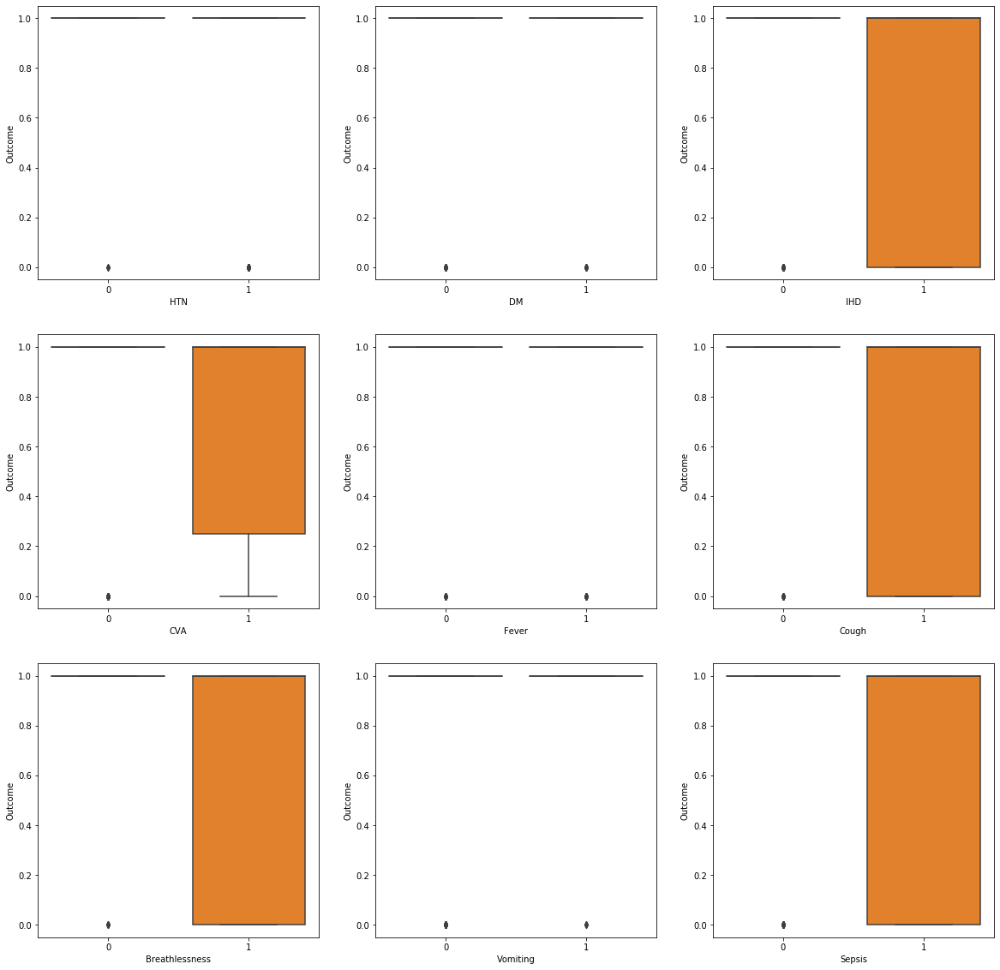

In [57]:
plt.figure(figsize=(20, 20))  
plt.subplot(3,3,1)
sns.boxplot(x = 'HTN', y = 'Outcome', data = df_aki)
plt.subplot(3,3,2)
sns.boxplot(x = 'DM', y = 'Outcome', data = df_aki)
plt.subplot(3,3,3)
sns.boxplot(x = 'IHD', y = 'Outcome', data = df_aki)
plt.subplot(3,3,4)
sns.boxplot(x = 'CVA', y = 'Outcome', data = df_aki)
plt.subplot(3,3,5)
sns.boxplot(x = 'Fever', y = 'Outcome', data = df_aki)
plt.subplot(3,3,6)
sns.boxplot(x = 'Cough', y = 'Outcome', data = df_aki)
plt.subplot(3,3,7)
sns.boxplot(x = 'Breathlessness', y = 'Outcome', data = df_aki)
plt.subplot(3,3,8)
sns.boxplot(x = 'Vomiting', y = 'Outcome', data = df_aki)
plt.subplot(3,3,9)
sns.boxplot(x = 'Sepsis', y = 'Outcome', data = df_aki)
plt.show()

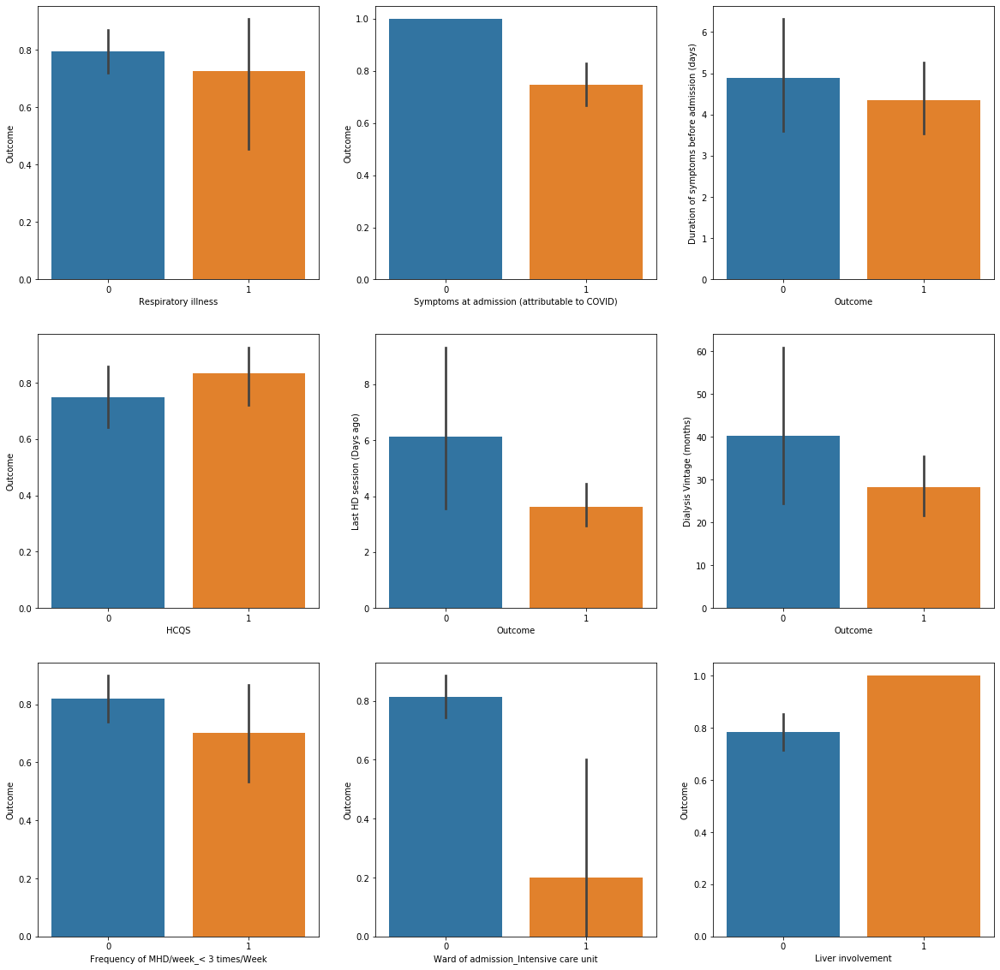

In [60]:
plt.figure(figsize=(20, 20))  
plt.subplot(3,3,1)
sns.barplot(data=df_aki,y="Outcome", x="Respiratory illness")
plt.subplot(3,3,2)
sns.barplot(data=df_aki,y="Outcome", x="Symptoms at admission (attributable to COVID)")
plt.subplot(3,3,3)
sns.barplot(data=df_aki,x="Outcome", y="Duration of symptoms before admission (days)")
plt.subplot(3,3,4)
sns.barplot(data=df_aki,y="Outcome", x="HCQS")
plt.subplot(3,3,5)
sns.barplot(data=df_aki,x="Outcome", y="Last HD session (Days ago)")
plt.subplot(3,3,6)
sns.barplot(data=df_aki,x="Outcome", y="Dialysis Vintage (months)")
plt.subplot(3,3,7)
sns.barplot(data=df_aki,y="Outcome", x="Frequency of MHD/week_< 3 times/Week")
plt.subplot(3,3,8)
sns.barplot(data=df_aki,y="Outcome", x="Ward of admission_Intensive care unit")
plt.subplot(3,3,9)
sns.barplot(data=df_aki,y="Outcome", x="Liver involvement")
plt.show()

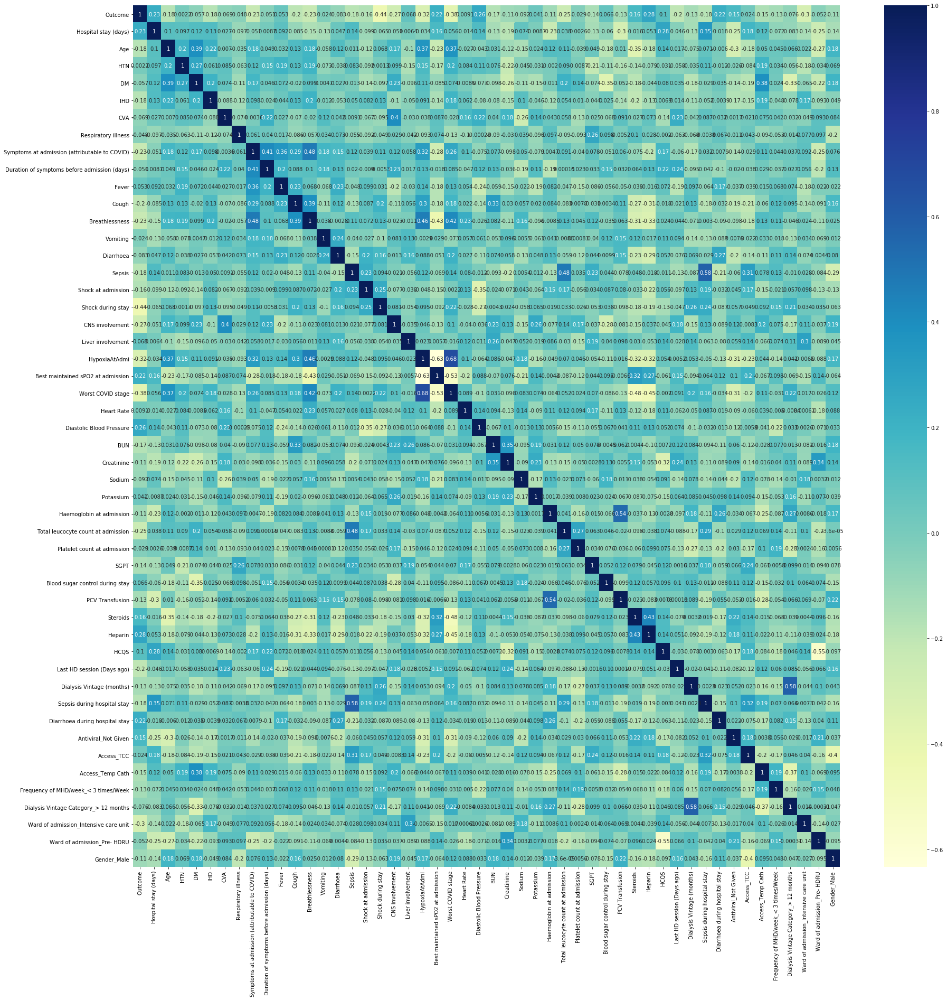

In [61]:
plt.figure(figsize = (30, 30))
sns.heatmap(df_aki.corr(), annot = True, cmap="YlGnBu")
plt.show()

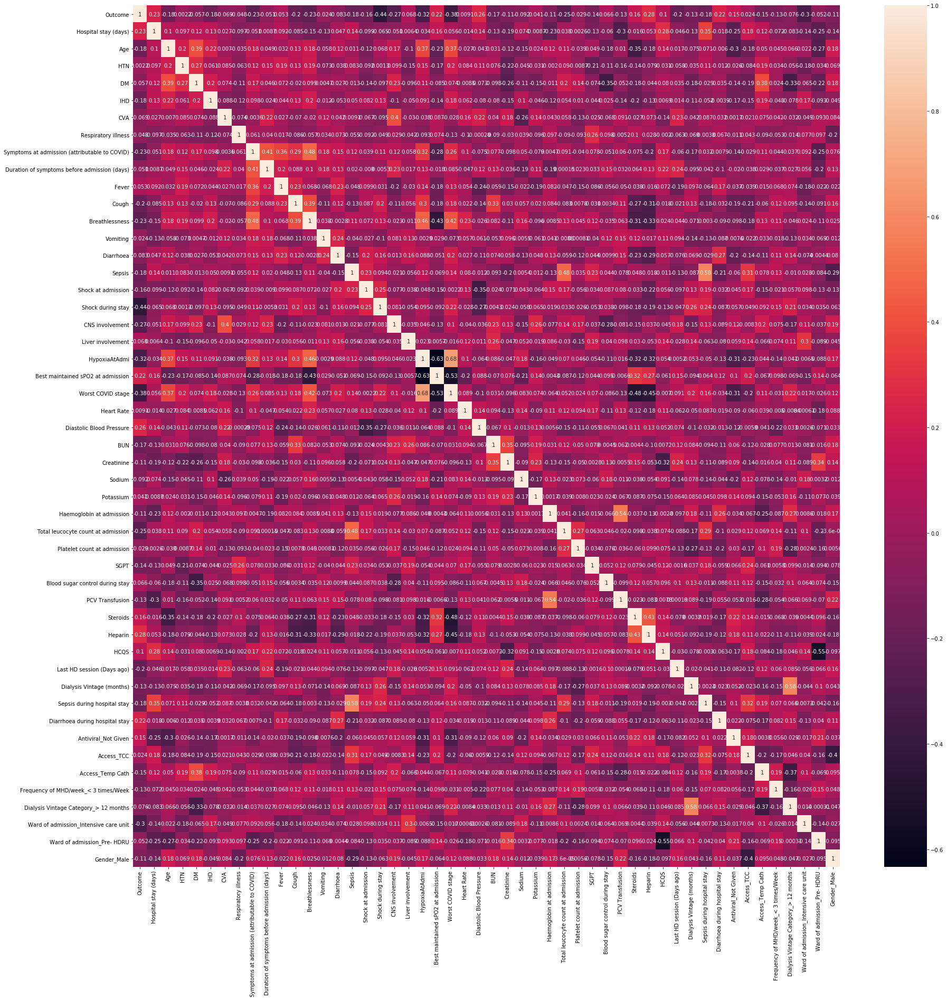

In [63]:
plt.figure(figsize = (30, 30))
sns.heatmap(df_aki.corr(), annot = True)
plt.show()

### Data Preparation and Model Building

In [64]:
# Importing test_train_split from sklearn library
from sklearn.model_selection import train_test_split

In [65]:

np.random.seed(0)
df_train, df_test = train_test_split(df_aki, train_size=0.7, test_size=0.3, random_state=100)

In [66]:
df_train

,Outcome,Hospital stay (days),Age,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Worst COVID stage,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Last HD session (Days ago),Dialysis Vintage (months),Sepsis during hospital stay,Diarrhoea during hospital stay,Antiviral_Not Given,Access_TCC,Access_Temp Cath,Frequency of MHD/week_< 3 times/Week,Dialysis Vintage Category_> 12 months,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
105.0,1,17.00000,68.0,1,1,0,0,0,1,1.0,0,1,1,0,0,0,0,0,0,0,1,90.00000,1.0,90.0,100.0,43.900000,7.000000,134.000000,6.100000,7.600000,7900.000000,280.000000,10.000000,0,1,0,0,0,6.000000,30.838095,0,0,0,0,0,0,1,0,0,1
101.0,1,12.00000,36.0,1,0,0,0,0,1,6.0,1,0,1,0,0,0,0,0,0,0,1,77.00000,1.0,110.0,80.0,106.000000,8.900000,134.000000,3.800000,8.900000,5700.000000,210.000000,13.000000,1,1,1,1,1,6.000000,7.000000,0,0,1,0,1,0,0,0,0,1
21.0,0,1.00000,35.0,1,0,0,0,0,1,2.0,1,1,1,0,0,1,1,1,0,0,1,90.00000,1.0,82.0,50.0,69.000000,6.400000,126.000000,4.000000,8.700000,14500.000000,140.000000,66.000000,1,1,0,1,0,2.000000,120.000000,0,0,1,1,0,0,1,0,1,0
42.0,1,15.00000,31.0,1,0,0,0,1,1,4.0,1,1,1,0,0,0,0,0,0,0,1,92.00000,0.0,84.0,100.0,81.000000,16.000000,127.000000,3.400000,9.900000,7600.000000,160.000000,57.397222,1,1,1,1,0,4.000000,6.000000,0,0,1,0,0,0,0,0,0,0
7.0,0,16.00000,50.0,1,0,0,1,0,1,10.0,1,1,1,0,0,0,0,0,0,0,1,91.00000,1.0,110.0,120.0,101.000000,19.000000,134.000000,3.700000,10.300000,4000.000000,80.000000,26.000000,1,1,1,1,0,14.000000,72.000000,0,0,0,0,0,0,1,0,1,1
4.0,1,18.00000,54.0,1,0,0,0,1,1,7.0,1,0,0,0,0,0,0,0,0,0,0,99.00000,0.0,90.0,90.0,65.000000,14.800000,131.000000,4.800000,12.200000,2700.000000,100.000000,10.000000,1,0,1,1,0,3.000000,18.000000,0,0,0,0,0,0,1,0,1,0
13.0,0,7.00000,35.0,1,0,0,0,0,1,10.0,0,0,0,0,0,1,0,1,0,0,1,97.00000,1.0,88.0,80.0,20.700000,5.400000,129.000000,6.600000,7.800000,8400.000000,230.000000,12.000000,1,0,1,1,0,3.000000,30.838095,1,0,1,0,0,0,1,0,1,0
78.0,1,19.00000,22.0,0,0,0,0,0,1,3.0,0,0,0,1,0,0,0,0,0,1,0,99.00000,0.0,86.0,90.0,17.000000,5.000000,136.000000,4.100000,10.400000,2600.000000,80.000000,25.000000,1,1,1,1,1,4.159292,30.838095,0,0,1,1,0,0,1,1,0,0
63.0,0,6.00000,45.0,1,0,0,0,0,1,7.0,0,1,1,0,1,0,1,1,0,0,0,97.00000,1.0,98.0,60.0,65.000000,4.000000,126.000000,5.500000,11.100000,14000.000000,240.000000,5.000000,1,1,0,0,0,4.000000,60.000000,1,0,1,0,0,1,1,0,0,1


In [67]:
from sklearn.preprocessing import MinMaxScaler

In [68]:
scaler=MinMaxScaler()

In [69]:
df_train[df_aki_num.columns] = scaler.fit_transform(df_train[df_aki_num.columns])

In [70]:
df_train

,Outcome,Hospital stay (days),Age,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission (attributable to COVID),Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis,Shock at admission,Shock during stay,CNS involvement,Liver involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Worst COVID stage,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin at admission,Total leucocyte count at admission,Platelet count at admission,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Last HD session (Days ago),Dialysis Vintage (months),Sepsis during hospital stay,Diarrhoea during hospital stay,Antiviral_Not Given,Access_TCC,Access_Temp Cath,Frequency of MHD/week_< 3 times/Week,Dialysis Vintage Category_> 12 months,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. no.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
105.0,1,0.205128,0.818182,1,1,0,0,0,1,0.033333,0,1,1,0,0,0,0,0,0,0,1,0.750000,1.0,0.310345,0.714286,0.136548,0.222222,0.560000,0.707317,0.250000,0.231660,0.596206,0.002290,0,1,0,0,0,0.172414,0.130695,0,0,0,0,0,0,1,0,0,1
101.0,1,0.141026,0.333333,1,0,0,0,0,1,0.200000,1,0,1,0,0,0,0,0,0,0,1,0.388889,1.0,0.655172,0.428571,0.451777,0.327778,0.560000,0.146341,0.362069,0.146718,0.406504,0.003665,1,1,1,1,1,0.172414,0.018779,0,0,1,0,1,0,0,0,0,1
21.0,0,0.000000,0.318182,1,0,0,0,0,1,0.066667,1,1,1,0,0,1,1,1,0,0,1,0.750000,1.0,0.172414,0.000000,0.263959,0.188889,0.240000,0.195122,0.344828,0.486486,0.216802,0.027943,1,1,0,1,0,0.034483,0.549296,0,0,1,1,0,0,1,0,1,0
42.0,1,0.179487,0.257576,1,0,0,0,1,1,0.133333,1,1,1,0,0,0,0,0,0,0,1,0.805556,0.0,0.206897,0.714286,0.324873,0.722222,0.280000,0.048780,0.448276,0.220077,0.271003,0.024002,1,1,1,1,0,0.103448,0.014085,0,0,1,0,0,0,0,0,0,0
7.0,0,0.192308,0.545455,1,0,0,1,0,1,0.333333,1,1,1,0,0,0,0,0,0,0,1,0.777778,1.0,0.655172,1.000000,0.426396,0.888889,0.560000,0.121951,0.482759,0.081081,0.054201,0.009620,1,1,1,1,0,0.448276,0.323944,0,0,0,0,0,0,1,0,1,1
4.0,1,0.217949,0.606061,1,0,0,0,1,1,0.233333,1,0,0,0,0,0,0,0,0,0,0,1.000000,0.0,0.310345,0.571429,0.243655,0.655556,0.440000,0.390244,0.646552,0.030888,0.108401,0.002290,1,0,1,1,0,0.068966,0.070423,0,0,0,0,0,0,1,0,1,0
13.0,0,0.076923,0.318182,1,0,0,0,0,1,0.333333,0,0,0,0,0,1,0,1,0,0,1,0.944444,1.0,0.275862,0.428571,0.018782,0.133333,0.360000,0.829268,0.267241,0.250965,0.460705,0.003207,1,0,1,1,0,0.068966,0.130695,1,0,1,0,0,0,1,0,1,0
78.0,1,0.230769,0.121212,0,0,0,0,0,1,0.100000,0,0,0,1,0,0,0,0,0,1,0,1.000000,0.0,0.241379,0.571429,0.000000,0.111111,0.640000,0.219512,0.491379,0.027027,0.054201,0.009162,1,1,1,1,1,0.108941,0.130695,0,0,1,1,0,0,1,1,0,0
63.0,0,0.064103,0.469697,1,0,0,0,0,1,0.233333,0,1,1,0,1,0,1,1,0,0,0,0.944444,1.0,0.448276,0.142857,0.243655,0.055556,0.240000,0.560976,0.551724,0.467181,0.487805,0.000000,1,1,0,0,0,0.103448,0.267606,1,0,1,0,0,1,1,0,0,1


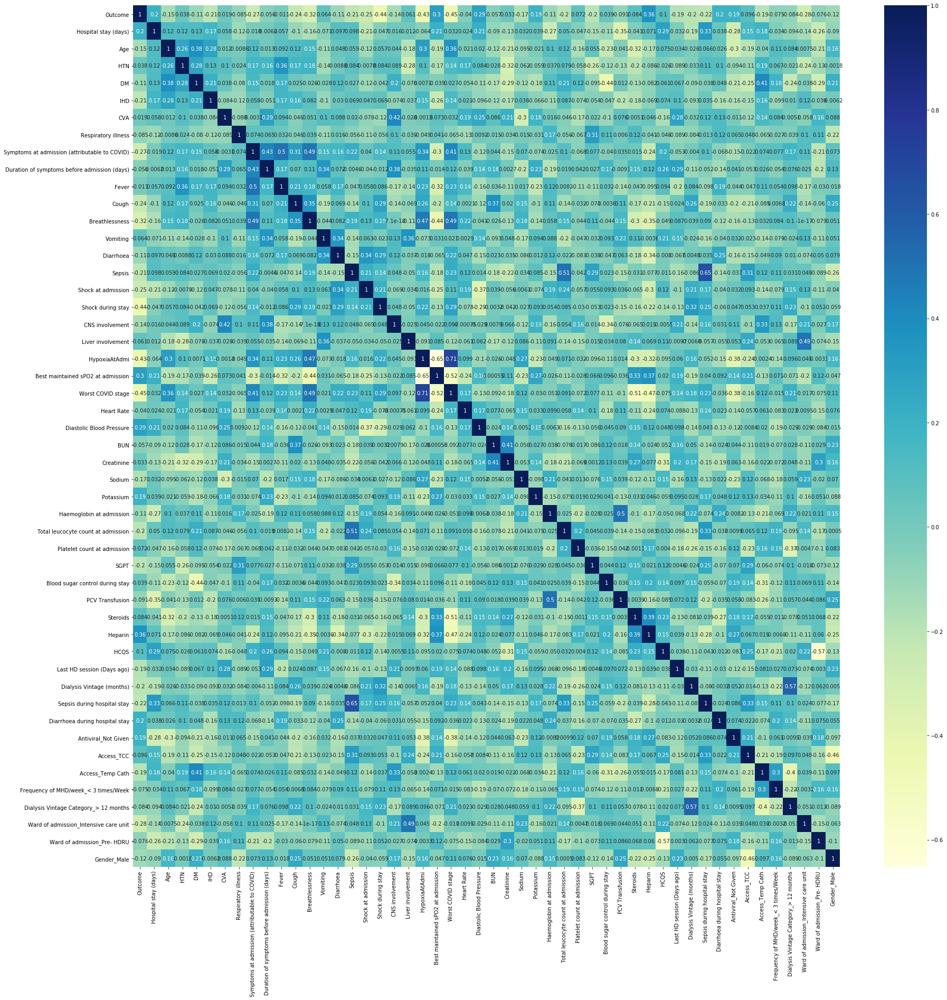

In [71]:
plt.figure(figsize = (30, 30))
sns.heatmap(df_train.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [72]:
y_train = df_train.pop('Outcome')


In [73]:
X_train = df_train

In [74]:
#np.asarray(df_train)

In [75]:
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train)

lr = sm.OLS(y_train, X_train_lm).fit()

lr.params

const                                            1.314553
Hospital stay (days)                             0.254100
Age                                             -0.133250
HTN                                             -0.020076
DM                                              -0.008843
IHD                                             -0.079483
CVA                                             -0.198562
Respiratory illness                             -0.191898
Symptoms at admission (attributable to COVID)   -0.054900
Duration of symptoms before admission (days)    -0.255776
Fever                                            0.151843
Cough                                           -0.179118
Breathlessness                                   0.110697
Vomiting                                        -0.199828
Diarrhoea                                       -0.057980
Sepsis                                          -0.053949
Shock at admission                               0.016659
Shock during s

In [76]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Outcome   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.471
Method:                 Least Squares   F-statistic:                     2.474
Date:                Sun, 05 Jun 2022   Prob (F-statistic):            0.00399
Time:                        15:22:06   Log-Likelihood:                 18.615
No. Observations:                  82   AIC:                             62.77
Df Residuals:                      32   BIC:                             183.1
Df Model:                          49                                         
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
const                                             1.3146      0.513      2.561      0.015       0.269       2.360
Hospital stay (days)                              0.2541      0.372      0.683      0.499      -0.503       1.011
Age                                              -0.1332      0.263     -0.506      0.616      -0.669       0.403
HTN                                              -0.0201      0.164     -0.123      0.903      -0.354       0.314
DM                                               -0.0088      0.140     -0.063      0.950      -0.294       0.277
IHD                                              -0.0795      0.174     -0.456      0.652      -0.435       0.276
CVA                                              -0.1986      0.244     -0.813      0.422      -0.696       0.299
Respiratory illness                              -0.1919      0.169     -1.138      0.264      -0.535       0.152
Symptoms at admission (attributable to COVID)    -0.0549      0.181     -0.303      0.764      -0.424       0.315
Duration of symptoms before admission (days)     -0.2558      0.427     -0.599      0.553      -1.125       0.613
Fever                                             0.1518      0.160      0.948      0.350      -0.175       0.478
Cough                                            -0.1791      0.155     -1.154      0.257      -0.495       0.137
Breathlessness                                    0.1107      0.117      0.945      0.352      -0.128       0.349
Vomiting                                         -0.1998      0.208     -0.961      0.344      -0.623       0.224
Diarrhoea                                        -0.0580      0.239     -0.242      0.810      -0.545       0.429
Sepsis                                           -0.0539      0.205     -0.264      0.794      -0.471       0.363
Shock at admission                                0.0167      0.248      0.067      0.947      -0.488       0.521
Shock during stay                                -0.3962      0.155     -2.548      0.016      -0.713      -0.079
CNS involvement                                   0.5015      0.349      1.437      0.160      -0.209       1.212
Liver involvement                                 1.0057      0.529      1.901      0.066      -0.072       2.083
HypoxiaAtAdmi                                    -0.0812      0.190     -0.428      0.672      -0.468       0.305
Best maintained sPO2 at admission                -0.1782      0.329     -0.542      0.592      -0.848       0.492
Worst COVID stage                                -0.1858      0.179     -1.039      0.307      -0.550       0.178
Heart Rate                                       -0.1555      0.272     -0.572      0.571      -0.709       0.398
Diast

In [77]:
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline

In [78]:
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso



#### Default Hyperparameters
Let's first fit a random forest model with default hyperparameters.

In [79]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier()

In [80]:
# fit
rfc.fit(X_train,y_train)

RandomForestClassifier()

In [81]:
df_test[df_aki_num.columns] = scaler.transform(df_test[df_aki_num.columns])


In [82]:
y_test = df_test.pop('Outcome')


In [83]:
X_test = df_test

In [84]:
# Making predictions
predictions = rfc.predict(X_test)

In [85]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [86]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      0.17      0.29         6
           1       0.86      1.00      0.92        30

    accuracy                           0.86        36
   macro avg       0.93      0.58      0.60        36
weighted avg       0.88      0.86      0.82        36



In [87]:
calculate_model_accurach(y_test, predictions)

[[ 1  5]
 [ 0 30]]
Precision: 1
Sensitivity: 1.0
Specificity: 0.17
Accuracy: 0.86


In [88]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[ 1  5]
 [ 0 30]]


In [89]:
print(accuracy_score(y_test,predictions))

0.8611111111111112


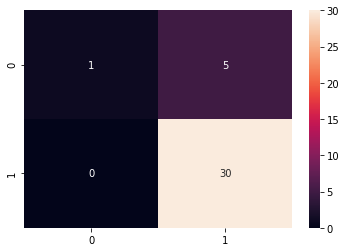

In [90]:
sns.heatmap(confusion_matrix(y_test,predictions), annot = True)
plt.show()

In [91]:
from sklearn import metrics

In [92]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

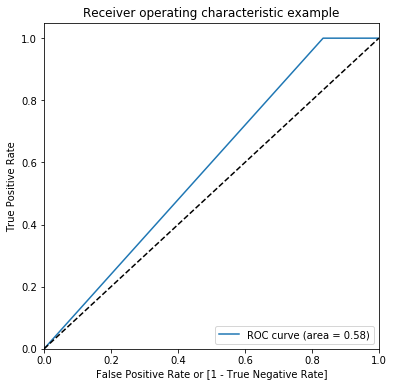

(array([0.        , 0.83333333, 1.        ]),
 array([0., 1., 1.]),
 array([2, 1, 0]))

In [93]:
draw_roc(y_test,predictions)

In [94]:
from sklearn.tree import export_graphviz

In [95]:
features = list(X_train.columns[0:])
estimator = rfc.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names =features,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [96]:
lrckd = LogisticRegression()
lrckd.fit(X_train, y_train)


# Applying FRE on the model
rfe = RFE(lrckd, 15)
rfe.fit(X_train, y_train)

RFE(estimator=LogisticRegression(), n_features_to_select=15)

In [97]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Hospital stay (days)', False, 9),
 ('Age', False, 35),
 ('HTN', False, 10),
 ('DM', False, 11),
 ('IHD', False, 7),
 ('CVA', False, 29),
 ('Respiratory illness', True, 1),
 ('Symptoms at admission (attributable to COVID)', False, 2),
 ('Duration of symptoms before admission (days)', False, 23),
 ('Fever', False, 6),
 ('Cough', False, 5),
 ('Breathlessness', False, 13),
 ('Vomiting', False, 24),
 ('Diarrhoea', False, 31),
 ('Sepsis', False, 16),
 ('Shock at admission', True, 1),
 ('Shock during stay', True, 1),
 ('CNS involvement', False, 18),
 ('Liver involvement', False, 30),
 ('HypoxiaAtAdmi', True, 1),
 ('Best maintained sPO2 at admission', False, 33),
 ('Worst COVID stage', True, 1),
 ('Heart Rate', False, 27),
 ('Diastolic Blood Pressure', True, 1),
 ('BUN', False, 26),
 ('Creatinine', False, 32),
 ('Sodium', False, 8),
 ('Potassium', True, 1),
 ('Haemoglobin at admission', False, 15),
 ('Total leucocyte count at admission', False, 4),
 ('Platelet count at admission', False, 21

In [98]:
# train set with RFE columns
X_train_rfe = X_train[X_train.columns[rfe.support_]]

# test set with RFE columns
X_test_rfe = X_test[X_test.columns[rfe.support_]]

In [99]:
logsk = LogisticRegression(C=1e9)
#logsk.fit(X_train[col], y_train)
logsk.fit(X_train_rfe, y_train)

LogisticRegression(C=1000000000.0)

In [100]:
y_pred_rfe = logsk.predict_proba(X_test_rfe)

In [101]:
y_pred_df = pd.DataFrame(y_pred_rfe)
# Converting to column dataframe
y_pred_1 = y_pred_df.iloc[:,[1]]
y_pred_1

,1
0,1.000000e+00
1,1.000000e+00
2,1.000000e+00
3,1.000000e+00
4,1.000000e+00
5,1.000000e+00
6,1.000000e+00
7,1.000000e+00
8,1.000000e+00
9,1.000000e+00


In [102]:
"{:2.2}".format(metrics.roc_auc_score(y_test, y_pred_1))

'0.62'

In [103]:
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,Outcome
Sr. no.,
85.0,1
86.0,1
38.0,0
46.0,1
98.0,1


In [104]:
y_pred_df.head()

,0,1
0,0.0,1.0
1,0.0,1.0
2,0.0,1.0
3,0.0,1.0
4,0.0,1.0


In [105]:
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df,y_pred_1],axis=1)
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 1 : 'Outcome_Prob'})
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Outcome','Outcome_Prob'], axis=1)
# Let's see the head of y_pred_final
y_pred_final.head()

,Outcome,Outcome_Prob
0,1,1.0
1,1,1.0
2,0,1.0
3,1,1.0
4,1,1.0


In [106]:
y_pred_final['predicted1'] = y_pred_final.Outcome_Prob.map( lambda x: 1 if x > 0.6 else 0)
y_pred_final['predicted2'] = y_pred_final.Outcome_Prob.map( lambda x: 1 if x > 0.7 else 0)
y_pred_final['predicted3'] = y_pred_final.Outcome_Prob.map( lambda x: 1 if x > 0.8 else 0)
y_pred_final.head(10)

,Outcome,Outcome_Prob,predicted1,predicted2,predicted3
0,1,1.0,1,1,1
1,1,1.0,1,1,1
2,0,1.0,1,1,1
3,1,1.0,1,1,1
4,1,1.0,1,1,1
5,1,1.0,1,1,1
6,1,1.0,1,1,1
7,1,1.0,1,1,1
8,1,1.0,1,1,1
9,1,1.0,1,1,1


In [107]:
y_pred_final.head(10)

,Outcome,Outcome_Prob,predicted1,predicted2,predicted3
0,1,1.0,1,1,1
1,1,1.0,1,1,1
2,0,1.0,1,1,1
3,1,1.0,1,1,1
4,1,1.0,1,1,1
5,1,1.0,1,1,1
6,1,1.0,1,1,1
7,1,1.0,1,1,1
8,1,1.0,1,1,1
9,1,1.0,1,1,1


In [108]:
metrics.accuracy_score(y_pred_final.Outcome, y_pred_final.predicted1)

0.8611111111111112

In [109]:
metrics.accuracy_score(y_pred_final.Outcome, y_pred_final.predicted2)

0.8611111111111112

In [110]:
metrics.accuracy_score(y_pred_final.Outcome, y_pred_final.predicted3)

0.8611111111111112

In [111]:
y_pred_0 = y_pred_df.iloc[:,[0]]
y_pred_0.head()

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0


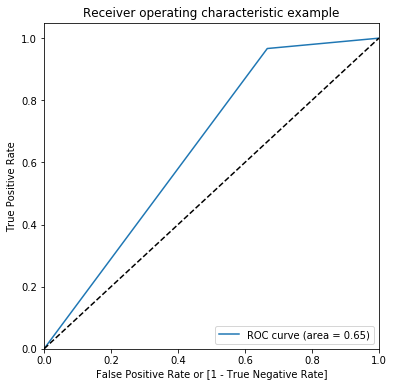

(array([0.        , 0.66666667, 1.        ]),
 array([0.        , 0.96666667, 1.        ]),
 array([2, 1, 0]))

In [112]:
draw_roc(y_pred_final.Outcome, y_pred_final.predicted2)

In [113]:
X_train_rfe.columns

Index(['Respiratory illness', 'Shock at admission', 'Shock during stay',
       'HypoxiaAtAdmi', 'Worst COVID stage', 'Diastolic Blood Pressure',
       'Potassium', 'PCV Transfusion', 'Steroids', 'Heparin',
       'Last HD session (Days ago)', 'Sepsis during hospital stay',
       'Diarrhoea during hospital stay', 'Access_Temp Cath',
       'Ward of admission_Intensive care unit'],
      dtype='object')

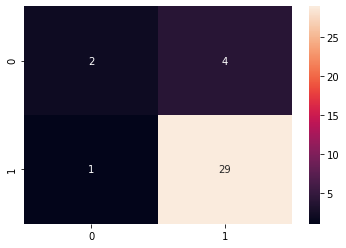

In [114]:
sns.heatmap(confusion_matrix(y_pred_final.Outcome, y_pred_final.predicted2), annot = True)
plt.show()

### confidence interval of Outcome in AKI dataset

In [116]:
import scipy.stats as st

In [117]:
st.norm.interval(alpha=0.95,
                 loc=np.mean(df_aki.Outcome),
                 scale=st.sem(df_aki.Outcome))

(0.7140924867135353, 0.8621786997271427)

<hr>

### Hyperparameter Tuning

The following hyperparameters are present in a random forest classifier. Note that most of these hypereparameters are actually of the decision trees that are in the forest.


- **n_estimators**: integer, optional (default=10): The number of trees in the forest.
- **criterion**: string, optional (default=”gini”)The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain. Note: this parameter is tree-specific.
- **max_features** : int, float, string or None, optional (default=”auto”)The number of features to consider when looking for the best split:
    - If int, then consider max_features features at each split.
    - If float, then max_features is a percentage and int(max_features * n_features) features are considered at each split.
    - If “auto”, then max_features=sqrt(n_features).
    - If “sqrt”, then max_features=sqrt(n_features) (same as “auto”).
    - If “log2”, then max_features=log2(n_features).
    - If None, then max_features=n_features.
    - Note: the search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than max_features features.
- **max_depth** : integer or None, optional (default=None)The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
- **min_samples_split** : int, float, optional (default=2)The minimum number of samples required to split an internal node:**
    - **If int, then consider min_samples_split as the minimum number.
    - **If float, then min_samples_split is a percentage and ceil(min_samples_split, n_samples) are the minimum number of samples for each split.
- **min_samples_leaf** : int, float, optional (default=1)The minimum number of samples required to be at a leaf node:**
    - **If int, then consider min_samples_leaf as the minimum number.**
    - **If float, then min_samples_leaf is a percentage and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.**
- **min_weight_fraction_leaf** : float, optional (default=0.)The minimum weighted fraction of the sum total of weights (of all the input samples) required to be at a leaf node. Samples have equal weight when sample_weight is not provided.
- **max_leaf_nodes** : int or None, optional (default=None)Grow trees with max_leaf_nodes in best-first fashion. Best nodes are defined as relative reduction in impurity. If None then unlimited number of leaf nodes.
- **min_impurity_split** : float,Threshold for early stopping in tree growth. A node will split if its impurity is above the threshold, otherwise it is a leaf.


<hr>

### Tuning max_depth

Let's try to find the optimum values for ```max_depth``` and understand how the value of max_depth impacts the overall accuracy of the ensemble.


In [118]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2",
                        return_train_score=True)
rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': range(2, 20, 5)}, return_train_score=True,
             scoring='r2')

In [119]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.144700,0.003499,0.013116,0.000423,2,{'max_depth': 2},-0.307692,0.346154,-0.230769,0.0,-0.333333,-0.105128,0.254402,4,0.306667,0.046667,0.34,0.137255,0.309804,0.228078,0.115361
1,0.159632,0.002064,0.014997,0.001537,7,{'max_depth': 7},0.019231,0.673077,-0.230769,0.0,0.333333,0.158974,0.313498,1,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,0.000000
2,0.149691,0.007011,0.013701,0.001152,12,{'max_depth': 12},0.019231,0.673077,-0.641026,0.0,0.666667,0.143590,0.491054,2,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,0.000000
3,0.155223,0.003738,0.014114,0.001638,17,{'max_depth': 17},0.019231,0.346154,-0.230769,0.0,0.000000,0.026923,0.184295,3,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,0.000000


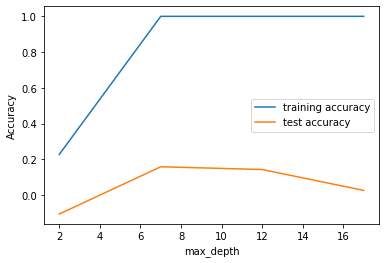

In [120]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


You can see that as we increase the value of max_depth, both train and test scores increase till a point, but after that test score starts to decrease. The ensemble tries to overfit as we increase the max_depth.

Thus, controlling the depth of the constituent trees will help reduce overfitting in the forest.

<hr>

### Tuning n_estimators

Let's try to find the optimum values for n_estimators and understand how the value of n_estimators impacts the overall accuracy. Notice that we'll specify an appropriately low value of max_depth, so that the trees do not overfit.
<br>


In [121]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2",
                        return_train_score=True)
rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(max_depth=4),
             param_grid={'n_estimators': range(100, 1500, 400)},
             return_train_score=True, scoring='r2')

In [122]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.150753,0.003547,0.013613,0.000786,100,{'n_estimators': 100},0.019231,0.673077,-0.230769,0.0,0.333333,0.158974,0.313498,1,0.913333,1.000000,0.9175,0.913725,1.0,0.948912,0.041739
1,0.708446,0.026224,0.050605,0.000894,500,{'n_estimators': 500},0.019231,0.346154,-0.230769,0.0,0.000000,0.026923,0.184295,2,1.000000,0.913333,0.9175,1.000000,1.0,0.966167,0.041458
2,1.241636,0.008799,0.091125,0.003678,900,{'n_estimators': 900},0.019231,0.346154,-0.230769,0.0,0.000000,0.026923,0.184295,2,1.000000,1.000000,1.0000,0.913725,1.0,0.982745,0.034510
3,1.789525,0.020228,0.158670,0.067047,1300,{'n_estimators': 1300},0.019231,0.346154,-0.230769,0.0,0.000000,0.026923,0.184295,2,1.000000,1.000000,1.0000,1.000000,1.0,1.000000,0.000000


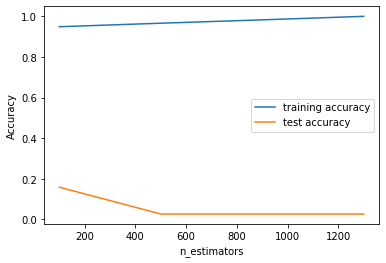

In [123]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


<hr>

### Tuning max_features

Let's see how the model performance varies with ```max_features```, which is the maximum numbre of features considered for splitting at a node.

In [124]:
# GridSearchCV to find optimal max_features
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2",
                        return_train_score=True)
rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(max_depth=4),
             param_grid={'max_features': [4, 8, 14, 20, 24]},
             return_train_score=True, scoring='r2')

In [125]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.141943,0.004957,0.012675,0.000519,4,{'max_features': 4},-0.307692,0.019231,-0.230769,0.000000,0.000000,-0.103846,0.137389,5,1.000000,0.826667,0.9175,0.827451,1.0,0.914324,0.077358
1,0.145859,0.002720,0.013270,0.001116,8,{'max_features': 8},0.019231,0.346154,-0.230769,0.000000,0.333333,0.093590,0.219437,4,0.913333,0.913333,0.9175,1.000000,1.0,0.948833,0.041805
2,0.152712,0.004133,0.013674,0.001458,14,{'max_features': 14},0.019231,0.673077,-0.230769,0.333333,0.333333,0.225641,0.307997,1,1.000000,1.000000,1.0000,1.000000,1.0,1.000000,0.000000
3,0.150197,0.003849,0.012930,0.000493,20,{'max_features': 20},0.019231,0.673077,-0.230769,0.333333,0.333333,0.225641,0.307997,1,1.000000,1.000000,1.0000,1.000000,1.0,1.000000,0.000000
4,0.152725,0.004048,0.012625,0.000580,24,{'max_features': 24},0.019231,0.673077,-0.230769,0.000000,0.666667,0.225641,0.373238,1,1.000000,1.000000,1.0000,1.000000,1.0,1.000000,0.000000


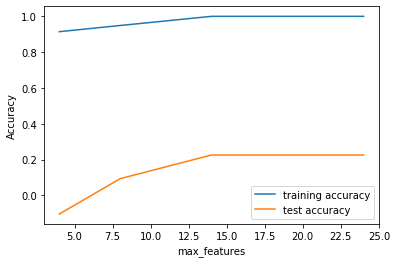

In [126]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


Apparently, the training and test scores *both* seem to increase as we increase max_features till value 14.

### Tuning min_samples_leaf

The hyperparameter **min_samples_leaf** is the minimum number of samples required to be at a leaf node:
- If int, then consider min_samples_leaf as the minimum number.
- If float, then min_samples_leaf is a percentage and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.

Let's now check the optimum value for min samples leaf in our case.

In [127]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2",
                        return_train_score=True)
rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'min_samples_leaf': range(100, 400, 50)},
             return_train_score=True, scoring='r2')

In [128]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.142023,0.007362,0.012849,0.000895,100,{'min_samples_leaf': 100},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
1,0.146622,0.005180,0.013331,0.000809,150,{'min_samples_leaf': 150},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
2,0.146017,0.003646,0.013370,0.001203,200,{'min_samples_leaf': 200},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
3,0.146938,0.006561,0.013374,0.001399,250,{'min_samples_leaf': 250},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
4,0.138433,0.002981,0.012135,0.000188,300,{'min_samples_leaf': 300},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546


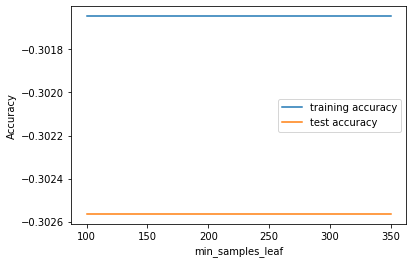

In [129]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

You can see that the model starts to show no variance as you increase the value of min_samples_leaf. 

### Tuning min_samples_split

Let's now look at the performance of the ensemble as we vary min_samples_split.

In [130]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2",
                        return_train_score=True)
rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'min_samples_split': range(200, 500, 50)},
             return_train_score=True, scoring='r2')

In [131]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.143961,0.005695,0.012529,0.000460,200,{'min_samples_split': 200},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
1,0.145618,0.004048,0.014151,0.001861,250,{'min_samples_split': 250},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
2,0.140070,0.004842,0.012983,0.001208,300,{'min_samples_split': 300},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
3,0.142977,0.006545,0.013530,0.001640,350,{'min_samples_split': 350},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546
4,0.142173,0.005324,0.013147,0.001364,400,{'min_samples_split': 400},-0.307692,-0.307692,-0.230769,-0.333333,-0.333333,-0.302564,0.037684,1,-0.3,-0.3,-0.32,-0.294118,-0.294118,-0.301647,0.009546


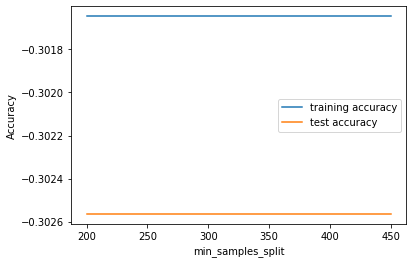

In [132]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

<hr>

## Grid Search to Find Optimal Hyperparameters

We can now find the optimal hyperparameters using GridSearchCV.

In [133]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [8,12,14],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100, 300, 500], 
    'max_features': [20,24,28]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1,
                        return_train_score=True)

In [134]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   24.0s
[Parallel(n_jobs=-1)]: Done 324 out of 324 | elapsed:   39.8s finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [8, 12, 14], 'max_features': [20, 24, 28],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [100, 300, 500]},
             return_train_score=True, verbose=1)

In [135]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.7685185185185185 using {'max_depth': 8, 'max_features': 20, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 100}


**Fitting the final model with the best parameters obtained from grid search.**

In [136]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc_tuned = RandomForestClassifier(bootstrap=True,
                             max_depth=8,
                             max_features=20,
                             min_samples_leaf=100,
                             min_samples_split=200,
                             n_estimators=100)

In [137]:
# fit
rfc_tuned.fit(X_train,y_train)

RandomForestClassifier(max_depth=8, max_features=20, min_samples_leaf=100,
                       min_samples_split=200)

In [138]:
# predict
predictions_tuned = rfc_tuned.predict(X_test)

In [139]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [140]:
print(classification_report(y_test,predictions_tuned))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.83      1.00      0.91        30

    accuracy                           0.83        36
   macro avg       0.42      0.50      0.45        36
weighted avg       0.69      0.83      0.76        36



In [141]:
print(confusion_matrix(y_test,predictions_tuned))

[[ 0  6]
 [ 0 30]]


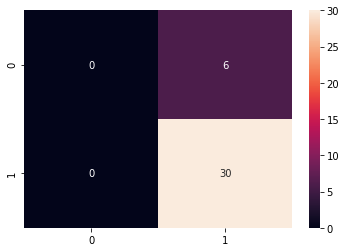

In [142]:
sns.heatmap(confusion_matrix(y_test,predictions_tuned), annot = True)
plt.show()

In [143]:
print(accuracy_score(y_test,predictions_tuned))

0.8333333333333334


In [144]:
calculate_model_accurach(y_test,predictions_tuned)

[[ 0  6]
 [ 0 30]]
Precision: 1
Sensitivity: 1.0
Specificity: 0.0
Accuracy: 0.83


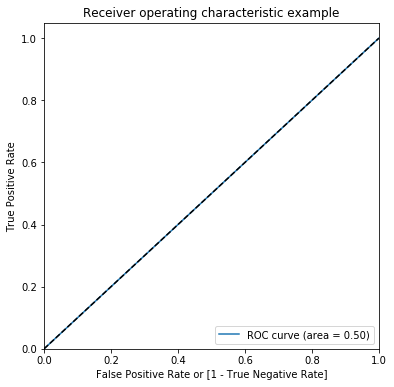

(array([0., 1.]), array([0., 1.]), array([2, 1]))

In [145]:
draw_roc(y_test,predictions_tuned)

### Model is underfitted with high bias

### Experiment on CKD with Covid dataset

In [146]:
#Calculate Missing Values
df_ckdcovid_missing = get_missing_values(df_ckdcovid)
df_ckdcovid_missing.head(len(df_ckdcovid_missing))

12 columns have missing values


,Missing Values,% of Missing Values,Data Type
BUN,15,12.93,float64
SGOT,9,7.76,float64
SGPT,9,7.76,float64
Total leucocyte count,3,2.59,float64
Platelet count,3,2.59,float64
Blood sugar control during stay,3,2.59,object
Haemoglobin,2,1.72,float64
Hospital stay (days),1,0.86,float64
Breathlessness,1,0.86,object
Creatinine,1,0.86,float64


In [147]:
df_ckdcovid_num=df_ckdcovid.select_dtypes(include=['float64'])
df_ckdcovid_num.head()

,Hospital stay (days),Age,Duration of symptoms before admission (days),Best maintained sPO2 at admission,O2 requirement at admission*,Maximum O2 Requirement*,Duration of O2 requirement (Days),COVID stage at admission,Most severe COVID stage during hospitalization,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGOT,SGPT
Sr. No.,,,,,,,,,,,,,,,,,,,,,
1.0,5.0,62.0,3.0,88.0,3.0,5.0,6.0,1.0,1.0,74.0,100.0,60.0,161.0,9.9,138.0,5.6,9.0,5700.0,124.0,19.0,10.0
2.0,12.0,57.0,15.0,95.0,0.0,0.0,0.0,0.0,0.0,90.0,80.0,46.0,97.5,12.8,123.0,4.5,5.3,10100.0,370.0,34.0,28.0
3.0,12.0,56.0,20.0,96.0,0.0,0.0,0.0,0.0,0.0,90.0,98.0,68.0,73.0,7.8,136.0,4.0,5.8,7400.0,300.0,21.0,20.0
4.0,18.0,24.0,0.0,84.0,4.0,4.0,15.0,1.0,1.0,100.0,106.0,60.0,34.7,2.7,135.0,5.6,5.7,20000.0,104.0,44.0,21.0
5.0,21.0,48.0,10.0,95.0,0.0,0.0,0.0,0.0,0.0,94.0,150.0,100.0,181.0,28.0,130.0,5.8,8.5,8400.0,100.0,22.0,44.0


In [148]:
df_ckdcovid[df_ckdcovid_num.columns] = df_ckdcovid[df_ckdcovid_num.columns].fillna(df_ckdcovid[df_ckdcovid_num.columns].median())


In [149]:
df_ckdcovid=df_ckdcovid.apply(lambda x: x.fillna(x.value_counts().index[0]))

In [150]:
#Calculate Missing Values
df_ckdcovid_missing = get_missing_values(df_ckdcovid)
df_ckdcovid_missing.head(len(df_ckdcovid_missing))

0 columns have missing values


,Missing Values,% of Missing Values,Data Type


In [151]:
df_ckdcovid_cat=df_ckdcovid.select_dtypes(include=['object'])
df_ckdcovid_cat.head()

,Ward of admission,Outcome,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,RenalOutcome,Underlying Chronic Kidney Disease,Oliguria,Dura Fever cat
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Intensive care unit,Death,Male,Present,No,Present,No,Present,Present,Present,Absent,Present,Absent,Present,Absent,Absent,Present,Absent,Absent,Present,Controlled,Not Required,Required,Required,Required,Not Required,Not applicable,Present,Present,1-3 days
2.0,HDRU,Survived,Male,Present,Present,No,Present,Present,Present,Absent,Absent,Absent,Present,Absent,Present,Present,Present,Present,Absent,Absent,Uncontrolled,Required,Not Required,Required,Required,Not Required,Not On Dialysis,Present,Present,>= 7 Day
3.0,HDRU,Survived,Female,Present,No,No,No,No,Present,Absent,Absent,Absent,Present,Absent,Present,Present,Present,Absent,Absent,Absent,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Not On Dialysis,Present,Absent,>= 7 Day
4.0,HDRU,Survived,Female,No,No,No,No,No,No,Absent,Absent,Absent,Absent,Absent,Present,Present,Present,Absent,Absent,Present,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Not On Dialysis,Absent,Present,1-3 days
5.0,HDRU,Survived,Male,No,No,No,No,No,Present,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Present,Absent,Absent,Controlled,Not Required,Not Required,Not Required,Not Required,Not Required,Not On Dialysis,Absent,Absent,>= 7 Day


In [152]:
df_ckdcovid_num=df_ckdcovid.select_dtypes(include=['float64'])
df_ckdcovid_num.head()

,Hospital stay (days),Age,Duration of symptoms before admission (days),Best maintained sPO2 at admission,O2 requirement at admission*,Maximum O2 Requirement*,Duration of O2 requirement (Days),COVID stage at admission,Most severe COVID stage during hospitalization,Heart Rate,Systolic Blood Pressure,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGOT,SGPT
Sr. No.,,,,,,,,,,,,,,,,,,,,,
1.0,5.0,62.0,3.0,88.0,3.0,5.0,6.0,1.0,1.0,74.0,100.0,60.0,161.0,9.9,138.0,5.6,9.0,5700.0,124.0,19.0,10.0
2.0,12.0,57.0,15.0,95.0,0.0,0.0,0.0,0.0,0.0,90.0,80.0,46.0,97.5,12.8,123.0,4.5,5.3,10100.0,370.0,34.0,28.0
3.0,12.0,56.0,20.0,96.0,0.0,0.0,0.0,0.0,0.0,90.0,98.0,68.0,73.0,7.8,136.0,4.0,5.8,7400.0,300.0,21.0,20.0
4.0,18.0,24.0,0.0,84.0,4.0,4.0,15.0,1.0,1.0,100.0,106.0,60.0,34.7,2.7,135.0,5.6,5.7,20000.0,104.0,44.0,21.0
5.0,21.0,48.0,10.0,95.0,0.0,0.0,0.0,0.0,0.0,94.0,150.0,100.0,181.0,28.0,130.0,5.8,8.5,8400.0,100.0,22.0,44.0


In [153]:
df_ckdcovid_cat_1=df_ckdcovid_cat[['Ward of admission', 'Gender']]
df_ckdcovid_cat_1

,Ward of admission,Gender
Sr. No.,,
1.0,Intensive care unit,Male
2.0,HDRU,Male
3.0,HDRU,Female
4.0,HDRU,Female
5.0,HDRU,Male
6.0,HDRU,Male
7.0,HDRU,Male
8.0,HDRU,Male
9.0,HDRU,Female


In [154]:
df_ckdcovid_cat_2=df_ckdcovid_cat[df_ckdcovid_cat.columns[3:]]
df_ckdcovid_cat_2

,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,RenalOutcome,Underlying Chronic Kidney Disease,Oliguria,Dura Fever cat
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Present,No,Present,No,Present,Present,Present,Absent,Present,Absent,Present,Absent,Absent,Present,Absent,Absent,Present,Controlled,Not Required,Required,Required,Required,Not Required,Not applicable,Present,Present,1-3 days
2.0,Present,Present,No,Present,Present,Present,Absent,Absent,Absent,Present,Absent,Present,Present,Present,Present,Absent,Absent,Uncontrolled,Required,Not Required,Required,Required,Not Required,Not On Dialysis,Present,Present,>= 7 Day
3.0,Present,No,No,No,No,Present,Absent,Absent,Absent,Present,Absent,Present,Present,Present,Absent,Absent,Absent,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Not On Dialysis,Present,Absent,>= 7 Day
4.0,No,No,No,No,No,No,Absent,Absent,Absent,Absent,Absent,Present,Present,Present,Absent,Absent,Present,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Not On Dialysis,Absent,Present,1-3 days
5.0,No,No,No,No,No,Present,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Present,Absent,Absent,Controlled,Not Required,Not Required,Not Required,Not Required,Not Required,Not On Dialysis,Absent,Absent,>= 7 Day
6.0,Present,Present,No,No,No,Present,Absent,Absent,Absent,Present,Absent,Present,Absent,Absent,Absent,Absent,Present,Uncontrolled,Not Required,Required,Not Required,Required,Not Required,Not On Dialysis,Present,Present,1-3 days
7.0,No,No,No,No,No,Present,Absent,Absent,Present,Absent,Absent,Present,Absent,Present,Absent,Absent,Present,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Not applicable,Absent,Present,1-3 days
8.0,Present,Present,No,No,No,Present,Present,Absent,Present,Absent,Absent,Present,Absent,Present,Present,Absent,Present,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Not applicable,Present,Present,1-3 days
9.0,Present,No,No,No,No,Present,Present,Absent,Present,Absent,Absent,Present,Present,Present,Absent,Absent,Present,Controlled,Required,Required,Required,Required,Not Required,Discharge on Dialysis,Present,Absent,1-3 days


In [155]:
df_ckdcovid_cat_2.describe()

,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,RenalOutcome,Underlying Chronic Kidney Disease,Oliguria,Dura Fever cat
count,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116,116
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,2,2,3
top,Present,No,No,No,No,Present,Present,Absent,Present,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Controlled,Not Required,Required,Not Required,Not Required,Not Required,Not applicable,Present,Absent,>= 7 Day
freq,76,61,106,106,106,111,64,93,69,89,99,86,106,76,85,113,61,87,65,73,75,66,81,51,81,61,49


In [156]:
len(df_ckdcovid_cat_2.columns)

27

In [157]:
df_ckdcovid.drop(['O2 requirement  at admission*',
       'Maximum O2 Requirement*', 'Duration of O2 requirement (Days)',
       'COVID stage at admission','Systolic Blood Pressure','SGOT'], axis=1, inplace=True)

In [158]:
df_ckdcovid_num.drop(['O2 requirement  at admission*',
       'Maximum O2 Requirement*', 'Duration of O2 requirement (Days)',
       'COVID stage at admission','Systolic Blood Pressure','SGOT'], axis=1, inplace=True)

In [159]:
#df_ckdcovid_num.drop(['O2 requirement  at admission*'], axis=1, inplace=True)
#df_ckdcovid=df_ckdcovid[df_ckdcovid.columns[~df_ckdcovid.columns.str.contains('Date')]]

In [160]:
def outcome_map(x):
    return x.map({'Survived':1, 'Death':0})

# Applying the function to the outcome column
df_ckdcovid[['Outcome']] = df_ckdcovid[['Outcome']].apply(outcome_map)

In [161]:
df_ckdcovid.Outcome

Sr. No. 
1.0      0
2.0      1
3.0      1
4.0      1
5.0      1
6.0      1
7.0      0
8.0      0
9.0      1
10.0     1
11.0     1
12.0     1
13.0     1
14.0     0
15.0     1
16.0     0
17.0     1
18.0     1
19.0     1
20.0     1
21.0     0
22.0     0
23.0     1
24.0     1
25.0     1
26.0     1
27.0     0
28.0     1
29.0     1
30.0     1
31.0     1
32.0     0
33.0     1
34.0     0
35.0     1
36.0     1
37.0     0
38.0     0
39.0     1
40.0     1
41.0     0
42.0     0
43.0     0
44.0     0
45.0     0
46.0     0
47.0     0
48.0     0
49.0     0
50.0     1
51.0     1
52.0     1
53.0     1
54.0     0
55.0     0
56.0     1
57.0     0
58.0     1
59.0     1
60.0     0
61.0     0
62.0     0
63.0     1
64.0     1
65.0     1
66.0     1
67.0     0
68.0     0
69.0     1
70.0     1
71.0     1
72.0     1
73.0     0
74.0     0
75.0     0
76.0     0
77.0     1
78.0     1
79.0     0
80.0     1
81.0     0
82.0     0
83.0     1
84.0     1
85.0     1
86.0     1
87.0     1
88.0     0
89.0     0
90.0     1
9

In [162]:
df_ckdcovid_av = pd.get_dummies(df_ckdcovid[['RenalOutcome','Dura Fever cat']], drop_first=True)

df_ckdcovid.drop(['RenalOutcome','Dura Fever cat'], axis=1, inplace=True)
df_ckdcovid = pd.concat([df_ckdcovid, df_ckdcovid_av], axis=1)
df_ckdcovid.head()

,Ward of admission,Outcome,Hospital stay (days),Age,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Most severe COVID stage during hospitalization,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Underlying Chronic Kidney Disease,Oliguria,RenalOutcome_Not On Dialysis,RenalOutcome_Not applicable,Dura Fever cat_4-6 days,Dura Fever cat_>= 7 Day
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Intensive care unit,0,5.0,62.0,Male,Present,No,Present,No,Present,Present,3.0,Present,Absent,Present,Absent,Present,Absent,Absent,Present,Absent,Absent,Present,88.0,1.0,74.0,60.0,161.0,9.9,138.0,5.6,9.0,5700.0,124.0,10.0,Controlled,Not Required,Required,Required,Required,Not Required,Present,Present,0,1,0,0
2.0,HDRU,1,12.0,57.0,Male,Present,Present,No,Present,Present,Present,15.0,Absent,Absent,Absent,Present,Absent,Present,Present,Present,Present,Absent,Absent,95.0,0.0,90.0,46.0,97.5,12.8,123.0,4.5,5.3,10100.0,370.0,28.0,Uncontrolled,Required,Not Required,Required,Required,Not Required,Present,Present,1,0,0,1
3.0,HDRU,1,12.0,56.0,Female,Present,No,No,No,No,Present,20.0,Absent,Absent,Absent,Present,Absent,Present,Present,Present,Absent,Absent,Absent,96.0,0.0,90.0,68.0,73.0,7.8,136.0,4.0,5.8,7400.0,300.0,20.0,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Present,Absent,1,0,0,1
4.0,HDRU,1,18.0,24.0,Female,No,No,No,No,No,No,0.0,Absent,Absent,Absent,Absent,Absent,Present,Present,Present,Absent,Absent,Present,84.0,1.0,100.0,60.0,34.7,2.7,135.0,5.6,5.7,20000.0,104.0,21.0,Controlled,Required,Not Required,Not Required,Not Required,Not Required,Absent,Present,1,0,0,0
5.0,HDRU,1,21.0,48.0,Male,No,No,No,No,No,Present,10.0,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Absent,Present,Absent,Absent,95.0,0.0,94.0,100.0,181.0,28.0,130.0,5.8,8.5,8400.0,100.0,44.0,Controlled,Not Required,Not Required,Not Required,Not Required,Not Required,Absent,Absent,1,0,0,1


In [163]:
df_ckdcovid_cat_2.drop(['RenalOutcome','Dura Fever cat'], axis=1, inplace=True)

In [164]:
def str_map(x):
    return x.map({'Present':1, 'No':0, 'Controlled':1, 'Uncontrolled':0, 'Required':0, 'Not Required':1, 'Absent':0})

# Applying the function to the two columns
df_ckdcovid[df_ckdcovid_cat_2.columns] = df_ckdcovid[df_ckdcovid_cat_2.columns].apply(str_map)


In [165]:
df_ckdcovid[df_ckdcovid_cat_2.columns]


,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Underlying Chronic Kidney Disease,Oliguria
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,1,0,1,0,1,1,1,0,1,0,1,0,0,1,0,0,1,1,1,0,0,0,1,1,1
2.0,1,1,0,1,1,1,0,0,0,1,0,1,1,1,1,0,0,0,0,1,0,0,1,1,1
3.0,1,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0,0,1,0,1,1,1,1,1,0
4.0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,1,1,1,1,0,1
5.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,1,1,1,1,0,0
6.0,1,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,0,1,1,1
7.0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,1,0,1,1,1,1,0,1
8.0,1,1,0,0,0,1,1,0,1,0,0,1,0,1,1,0,1,1,0,1,1,1,1,1,1
9.0,1,0,0,0,0,1,1,0,1,0,0,1,1,1,0,0,1,1,0,0,0,0,1,1,0


In [166]:
df_ckdcovid.head()

,Ward of admission,Outcome,Hospital stay (days),Age,Gender,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Most severe COVID stage during hospitalization,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Underlying Chronic Kidney Disease,Oliguria,RenalOutcome_Not On Dialysis,RenalOutcome_Not applicable,Dura Fever cat_4-6 days,Dura Fever cat_>= 7 Day
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,Intensive care unit,0,5.0,62.0,Male,1,0,1,0,1,1,3.0,1,0,1,0,1,0,0,1,0,0,1,88.0,1.0,74.0,60.0,161.0,9.9,138.0,5.6,9.0,5700.0,124.0,10.0,1,1,0,0,0,1,1,1,0,1,0,0
2.0,HDRU,1,12.0,57.0,Male,1,1,0,1,1,1,15.0,0,0,0,1,0,1,1,1,1,0,0,95.0,0.0,90.0,46.0,97.5,12.8,123.0,4.5,5.3,10100.0,370.0,28.0,0,0,1,0,0,1,1,1,1,0,0,1
3.0,HDRU,1,12.0,56.0,Female,1,0,0,0,0,1,20.0,0,0,0,1,0,1,1,1,0,0,0,96.0,0.0,90.0,68.0,73.0,7.8,136.0,4.0,5.8,7400.0,300.0,20.0,1,0,1,1,1,1,1,0,1,0,0,1
4.0,HDRU,1,18.0,24.0,Female,0,0,0,0,0,0,0.0,0,0,0,0,0,1,1,1,0,0,1,84.0,1.0,100.0,60.0,34.7,2.7,135.0,5.6,5.7,20000.0,104.0,21.0,1,0,1,1,1,1,0,1,1,0,0,0
5.0,HDRU,1,21.0,48.0,Male,0,0,0,0,0,1,10.0,0,0,0,0,0,0,0,0,1,0,0,95.0,0.0,94.0,100.0,181.0,28.0,130.0,5.8,8.5,8400.0,100.0,44.0,1,1,1,1,1,1,0,0,1,0,0,1


In [167]:
df_ckdcovid_cat_11 = pd.get_dummies(df_ckdcovid_cat_1, drop_first=True)
df_ckdcovid_cat_11

,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. No.,,,
1.0,1,0,1
2.0,0,0,1
3.0,0,0,0
4.0,0,0,0
5.0,0,0,1
6.0,0,0,1
7.0,0,0,1
8.0,0,0,1
9.0,0,0,0


<hr>

In [168]:
df_ckdcovid.drop(list(df_ckdcovid_cat_1), axis=1, inplace=True)

In [169]:
df_ckdcovid = pd.concat([df_ckdcovid, df_ckdcovid_cat_11], axis=1)

In [170]:
df_ckdcovid.head()

,Outcome,Hospital stay (days),Age,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Most severe COVID stage during hospitalization,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Underlying Chronic Kidney Disease,Oliguria,RenalOutcome_Not On Dialysis,RenalOutcome_Not applicable,Dura Fever cat_4-6 days,Dura Fever cat_>= 7 Day,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,0,5.0,62.0,1,0,1,0,1,1,3.0,1,0,1,0,1,0,0,1,0,0,1,88.0,1.0,74.0,60.0,161.0,9.9,138.0,5.6,9.0,5700.0,124.0,10.0,1,1,0,0,0,1,1,1,0,1,0,0,1,0,1
2.0,1,12.0,57.0,1,1,0,1,1,1,15.0,0,0,0,1,0,1,1,1,1,0,0,95.0,0.0,90.0,46.0,97.5,12.8,123.0,4.5,5.3,10100.0,370.0,28.0,0,0,1,0,0,1,1,1,1,0,0,1,0,0,1
3.0,1,12.0,56.0,1,0,0,0,0,1,20.0,0,0,0,1,0,1,1,1,0,0,0,96.0,0.0,90.0,68.0,73.0,7.8,136.0,4.0,5.8,7400.0,300.0,20.0,1,0,1,1,1,1,1,0,1,0,0,1,0,0,0
4.0,1,18.0,24.0,0,0,0,0,0,0,0.0,0,0,0,0,0,1,1,1,0,0,1,84.0,1.0,100.0,60.0,34.7,2.7,135.0,5.6,5.7,20000.0,104.0,21.0,1,0,1,1,1,1,0,1,1,0,0,0,0,0,0
5.0,1,21.0,48.0,0,0,0,0,0,1,10.0,0,0,0,0,0,0,0,0,1,0,0,95.0,0.0,94.0,100.0,181.0,28.0,130.0,5.8,8.5,8400.0,100.0,44.0,1,1,1,1,1,1,0,0,1,0,0,1,0,0,1


In [171]:
df_ckdcovid.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 116 entries, 1.0 to 116.0
Data columns (total 48 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Outcome                                         116 non-null    int64  
 1   Hospital stay (days)                            116 non-null    float64
 2   Age                                             116 non-null    float64
 3   HTN                                             116 non-null    int64  
 4   DM                                              116 non-null    int64  
 5   IHD                                             116 non-null    int64  
 6   CVA                                             116 non-null    int64  
 7   Respiratory illness                             116 non-null    int64  
 8   Symptoms at admission                           116 non-null    int64  
 9   Duration of symptoms before admission

### Data Preparation and Model Building

In [172]:
# Importing test_train_split from sklearn library
from sklearn.model_selection import train_test_split

In [173]:

np.random.seed(0)
df_trainckd, df_testckd = train_test_split(df_ckdcovid, train_size=0.7, test_size=0.3, random_state=100)

In [174]:
df_trainckd

,Outcome,Hospital stay (days),Age,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Most severe COVID stage during hospitalization,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Underlying Chronic Kidney Disease,Oliguria,RenalOutcome_Not On Dialysis,RenalOutcome_Not applicable,Dura Fever cat_4-6 days,Dura Fever cat_>= 7 Day,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
103.0,0,4.0,63.0,1,0,0,0,0,1,15.0,1,1,1,0,0,1,0,0,1,0,1,75.0,1.0,116.0,74.0,21.5,1.10,138.0,4.5,11.6,36100.0,170.0,13.0,1,1,0,0,1,0,0,1,0,1,0,1,1,0,0
21.0,0,9.0,54.0,0,0,0,0,0,1,7.0,1,0,1,0,1,0,0,1,0,0,1,72.0,1.0,92.0,70.0,20.9,1.50,127.0,4.5,12.4,13500.0,140.0,166.0,1,1,0,0,0,0,0,1,0,1,0,1,0,0,1
65.0,1,12.0,42.0,1,0,0,0,0,1,10.0,1,1,1,0,0,0,0,0,0,0,1,83.0,1.0,84.0,80.0,86.0,15.00,137.0,3.9,9.7,9700.0,195.0,11.0,1,1,0,1,1,0,1,1,0,0,0,1,0,0,1
7.0,0,12.0,58.0,0,0,0,0,0,1,2.0,0,0,1,0,0,1,0,1,0,0,1,98.0,1.0,74.0,76.0,83.2,23.80,125.0,6.0,8.2,9900.0,280.0,21.0,1,0,1,1,1,1,0,1,0,1,0,0,0,0,1
4.0,1,18.0,24.0,0,0,0,0,0,0,0.0,0,0,0,0,0,1,1,1,0,0,1,84.0,1.0,100.0,60.0,34.7,2.70,135.0,5.6,5.7,20000.0,104.0,21.0,1,0,1,1,1,1,0,1,1,0,0,0,0,0,0
13.0,1,20.0,70.0,0,0,1,0,1,1,8.0,1,0,1,0,1,0,0,1,1,0,1,76.0,1.0,88.0,70.0,38.0,8.00,131.0,3.6,7.5,9400.0,180.0,22.0,1,0,1,1,0,1,0,1,1,0,0,1,0,0,0
107.0,1,71.0,36.0,1,0,0,0,0,1,4.0,1,0,1,0,0,0,0,0,0,0,0,97.0,1.0,82.0,100.0,69.7,11.30,118.0,4.0,6.8,13100.0,200.0,7.0,1,1,0,1,1,0,1,0,0,0,1,0,0,0,0
86.0,1,42.0,28.0,0,0,0,0,0,1,6.0,1,0,1,0,0,0,0,0,0,0,0,99.0,0.0,90.0,80.0,36.0,3.40,132.0,3.6,8.9,10100.0,110.0,7.0,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0
77.0,1,13.0,43.0,1,0,0,0,0,1,3.0,0,0,0,0,0,0,0,0,0,0,0,99.0,0.0,90.0,90.0,69.7,14.00,136.0,3.9,6.8,9800.0,240.0,11.0,1,0,1,1,1,1,1,0,0,0,0,0,0,0,1


In [175]:
from sklearn.preprocessing import MinMaxScaler

In [176]:
scalerckd=MinMaxScaler()

In [177]:
df_trainckd[df_ckdcovid_num.columns] = scalerckd.fit_transform(df_trainckd[df_ckdcovid_num.columns])

In [178]:
df_trainckd

,Outcome,Hospital stay (days),Age,HTN,DM,IHD,CVA,Respiratory illness,Symptoms at admission,Duration of symptoms before admission (days),Fever,Cough,Breathlessness,Vomiting,Diarrhoea,Sepsis at admission,Shock at admission,Shock during stay,CNS involvement,Liver Involvement,HypoxiaAtAdmi,Best maintained sPO2 at admission,Most severe COVID stage during hospitalization,Heart Rate,Diastolic Blood Pressure,BUN,Creatinine,Sodium,Potassium,Haemoglobin,Total leucocyte count,Platelet count,SGPT,Blood sugar control during stay,PCV Transfusion,Steroids,Heparin,HCQS,Antiviral,Underlying Chronic Kidney Disease,Oliguria,RenalOutcome_Not On Dialysis,RenalOutcome_Not applicable,Dura Fever cat_4-6 days,Dura Fever cat_>= 7 Day,Ward of admission_Intensive care unit,Ward of admission_Pre- HDRU,Gender_Male
Sr. No.,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
103.0,0,0.028986,0.716418,1,0,0,0,0,1,0.333333,1,1,1,0,0,1,0,0,1,0,1,0.730337,1.0,0.823529,0.437500,0.021739,0.000000,0.632653,0.302326,0.672269,0.765403,0.357143,0.037383,1,1,0,0,1,0,0,1,0,1,0,1,1,0,0
21.0,0,0.101449,0.582090,0,0,0,0,0,1,0.155556,1,0,1,0,1,0,0,1,0,0,1,0.696629,1.0,0.470588,0.375000,0.018841,0.011461,0.408163,0.302326,0.739496,0.229858,0.285714,0.752336,1,1,0,0,0,0,0,1,0,1,0,1,0,0,1
65.0,1,0.144928,0.402985,1,0,0,0,0,1,0.222222,1,1,1,0,0,0,0,0,0,0,1,0.820225,1.0,0.352941,0.531250,0.333333,0.398281,0.612245,0.162791,0.512605,0.139810,0.416667,0.028037,1,1,0,1,1,0,1,1,0,0,0,1,0,0,1
7.0,0,0.144928,0.641791,0,0,0,0,0,1,0.044444,0,0,1,0,0,1,0,1,0,0,1,0.988764,1.0,0.205882,0.468750,0.319807,0.650430,0.367347,0.651163,0.386555,0.144550,0.619048,0.074766,1,0,1,1,1,1,0,1,0,1,0,0,0,0,1
4.0,1,0.231884,0.134328,0,0,0,0,0,0,0.000000,0,0,0,0,0,1,1,1,0,0,1,0.831461,1.0,0.588235,0.218750,0.085507,0.045845,0.571429,0.558140,0.176471,0.383886,0.200000,0.074766,1,0,1,1,1,1,0,1,1,0,0,0,0,0,0
13.0,1,0.260870,0.820896,0,0,1,0,1,1,0.177778,1,0,1,0,1,0,0,1,1,0,1,0.741573,1.0,0.411765,0.375000,0.101449,0.197708,0.489796,0.093023,0.327731,0.132701,0.380952,0.079439,1,0,1,1,0,1,0,1,1,0,0,1,0,0,0
107.0,1,1.000000,0.313433,1,0,0,0,0,1,0.088889,1,0,1,0,0,0,0,0,0,0,0,0.977528,1.0,0.323529,0.843750,0.254589,0.292264,0.224490,0.186047,0.268908,0.220379,0.428571,0.009346,1,1,0,1,1,0,1,0,0,0,1,0,0,0,0
86.0,1,0.579710,0.194030,0,0,0,0,0,1,0.133333,1,0,1,0,0,0,0,0,0,0,0,1.000000,0.0,0.441176,0.531250,0.091787,0.065903,0.510204,0.093023,0.445378,0.149289,0.214286,0.009346,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0
77.0,1,0.159420,0.417910,1,0,0,0,0,1,0.066667,0,0,0,0,0,0,0,0,0,0,0,1.000000,0.0,0.441176,0.687500,0.254589,0.369628,0.591837,0.162791,0.268908,0.142180,0.523810,0.028037,1,0,1,1,1,1,1,0,0,0,0,0,0,0,1


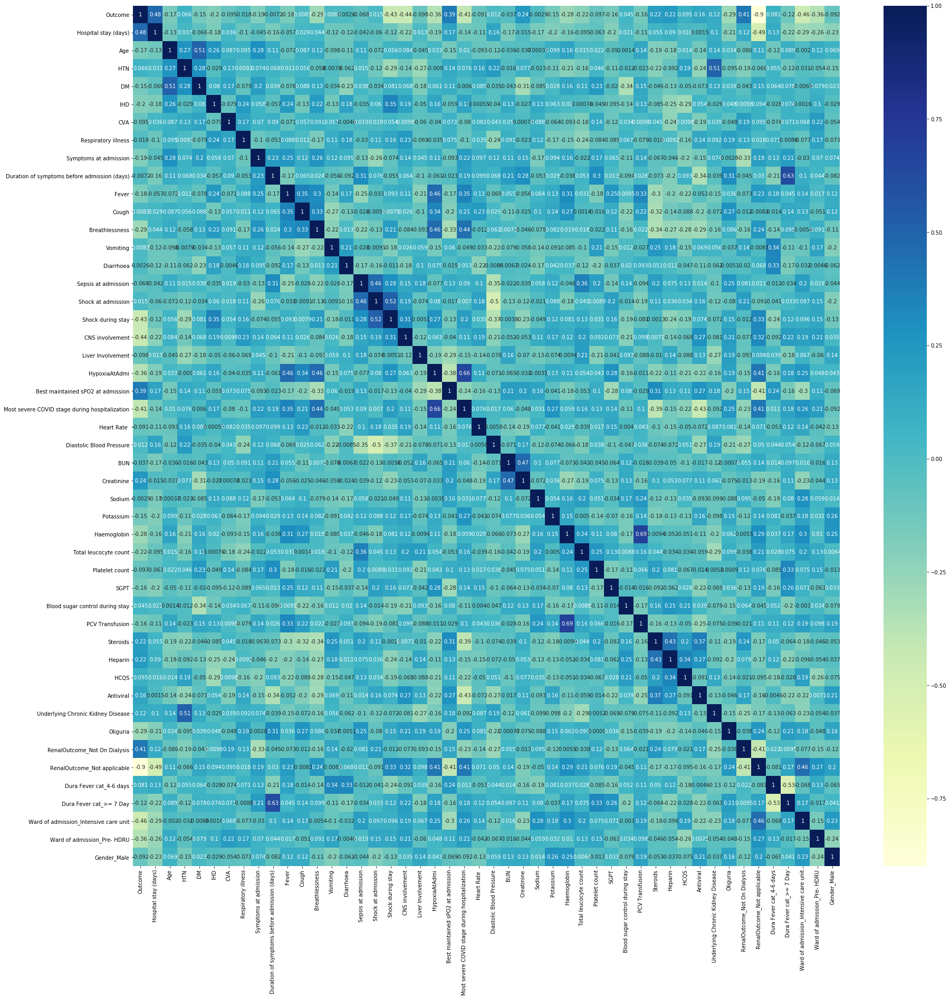

In [179]:
plt.figure(figsize = (30, 30))
sns.heatmap(df_trainckd.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [180]:
y_trainckd = df_trainckd.pop('Outcome')


In [181]:
X_trainckd = df_trainckd

In [182]:
np.asarray(df_trainckd)

array([[0.02898551, 0.71641791, 1.        , ..., 1.        , 0.        ,
        0.        ],
       [0.10144928, 0.58208955, 0.        , ..., 0.        , 0.        ,
        1.        ],
       [0.14492754, 0.40298507, 1.        , ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.08695652, 0.25373134, 0.        , ..., 1.        , 0.        ,
        1.        ],
       [0.14492754, 0.52238806, 1.        , ..., 0.        , 0.        ,
        1.        ],
       [0.55072464, 0.52238806, 1.        , ..., 0.        , 0.        ,
        0.        ]])

In [183]:
import statsmodels.api as sm
X_train_lmckd = sm.add_constant(X_trainckd)

lrckd = sm.OLS(y_trainckd, X_train_lmckd).fit()

lrckd.params

const                                             1.463529
Hospital stay (days)                              0.241923
Age                                              -0.050046
HTN                                              -0.042154
DM                                                0.070941
IHD                                              -0.084117
CVA                                               0.003808
Respiratory illness                               0.086724
Symptoms at admission                            -0.110227
Duration of symptoms before admission (days)      0.200741
Fever                                             0.094439
Cough                                             0.109515
Breathlessness                                   -0.167475
Vomiting                                         -0.063057
Diarrhoea                                         0.123256
Sepsis at admission                               0.007766
Shock at admission                                0.0074

In [184]:
lrckd.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Outcome   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.851
Method:                 Least Squares   F-statistic:                     10.73
Date:                Sun, 05 Jun 2022   Prob (F-statistic):           1.19e-10
Time:                        15:34:27   Log-Likelihood:                 55.251
No. Observations:                  81   AIC:                            -14.50
Df Residuals:                      33   BIC:                             100.4
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
==================================================================================================================
                                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
const                                              1.4635      0.490      2.987      0.005       0.467       2.460
Hospital stay (days)                               0.2419      0.208      1.160      0.254      -0.182       0.666
Age                                               -0.0500      0.221     -0.226      0.822      -0.500       0.400
HTN                                               -0.0422      0.078     -0.543      0.591      -0.200       0.116
DM                                                 0.0709      0.083      0.858      0.397      -0.097       0.239
IHD                                               -0.0841      0.156     -0.539      0.593      -0.401       0.233
CVA                                                0.0038      0.124      0.031      0.976      -0.248       0.255
Respiratory illness                                0.0867      0.110      0.787      0.437      -0.137       0.311
Symptoms at admission                             -0.1102      0.174     -0.632      0.532      -0.465       0.245
Duration of symptoms before admission (days)       0.2007      0.275      0.730      0.471      -0.359       0.760
Fever                                              0.0944      0.089      1.065      0.295      -0.086       0.275
Cough                                              0.1095      0.087      1.255      0.218      -0.068       0.287
Breathlessness                                    -0.1675      0.077     -2.166      0.038      -0.325      -0.010
Vomiting                                          -0.0631      0.095     -0.665      0.510      -0.256       0.130
Diarrhoea                                          0.1233      0.092      1.346      0.187      -0.063       0.310
Sepsis at admission                                0.0078      0.103      0.075      0.940      -0.202       0.218
Shock at admission                                 0.0075      0.158      0.048      0.962      -0.313       0.328
Shock during stay                                 -0.2166      0.098     -2.207      0.034      -0.416      -0.017
CNS involvement                                   -0.1924      0.079     -2.424      0.021      -0.354      -0.031
Liver Involvement                                 -0.1468      0.239     -0.614      0.544      -0.634       0.340
HypoxiaAtAdmi                                     -0.0853      0.089     -0.958      0.345      -0.267       0.096
Best maintained sPO2 at admission                 -0.0453      0.296     -0.153      0.879      -0.649       0.558
Most severe COVID stage during hospitalization     0.1014      0.100      1.009      0.320      -0.103       0.306
Heart Rate                                         0.0805      0.165      0.489      0.628   



#### Default Hyperparameters
Let's first fit a random forest model with default hyperparameters.

In [185]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfcckd = RandomForestClassifier()

In [186]:
# fit
rfcckd.fit(X_trainckd,y_trainckd)

RandomForestClassifier()

In [187]:
df_testckd[df_ckdcovid_num.columns] = scalerckd.transform(df_testckd[df_ckdcovid_num.columns])


In [188]:
y_testckd = df_testckd.pop('Outcome')


In [189]:
X_testckd = df_testckd

In [190]:
# Making predictions
predictionsckd = rfcckd.predict(X_testckd)

In [191]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [192]:
# Let's check the report of our default model
print(classification_report(y_testckd,predictionsckd))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97        17
           1       0.95      1.00      0.97        18

    accuracy                           0.97        35
   macro avg       0.97      0.97      0.97        35
weighted avg       0.97      0.97      0.97        35



In [193]:
calculate_model_accurach(y_testckd, predictionsckd)

[[16  1]
 [ 0 18]]
Precision: 1
Sensitivity: 1.0
Specificity: 0.94
Accuracy: 0.97


In [194]:
# Printing confusion matrix
print(confusion_matrix(y_testckd,predictionsckd))

[[16  1]
 [ 0 18]]


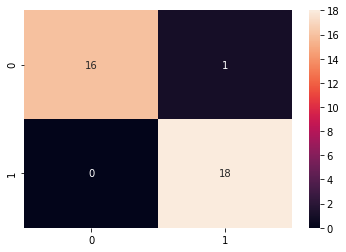

In [195]:
sns.heatmap(confusion_matrix(y_testckd,predictionsckd), annot = True)
plt.show()

In [196]:
print(accuracy_score(y_testckd,predictionsckd))

0.9714285714285714


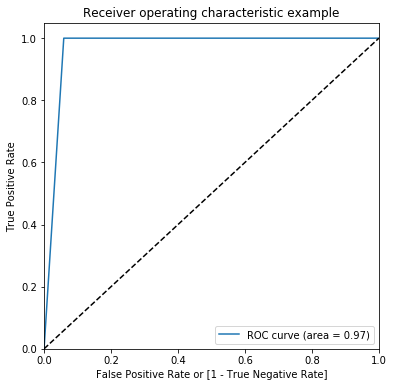

(array([0.        , 0.05882353, 1.        ]),
 array([0., 1., 1.]),
 array([2, 1, 0]))

In [197]:
draw_roc(y_testckd,predictionsckd)

### confidence interval of Outcome in CKD dataset

In [198]:
import numpy as np
import scipy.stats as st
  
# create 90% confidence interval
# for population mean weight
st.norm.interval(alpha=0.95,
                 loc=np.mean(y_testckd),
                 scale=st.sem(y_testckd))

(0.3462888013251382, 0.6822826272462903)

In [199]:
from sklearn.tree import export_graphviz

In [203]:
features = list(X_trainckd.columns[0:])
estimator = rfcckd.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree_ckd.dot', 
                feature_names =features,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree_ckd.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree_ckd.png')

In [204]:
lrckd2 = LogisticRegression()
lrckd2.fit(X_trainckd,y_trainckd)


# Applying FRE on the model
rfe2 = RFE(lrckd2, 15)
rfe2.fit(X_trainckd,y_trainckd)

RFE(estimator=LogisticRegression(), n_features_to_select=15)

In [205]:
list(zip(X_trainckd.columns,rfe2.support_,rfe2.ranking_))

[('Hospital stay (days)', True, 1),
 ('Age', False, 18),
 ('HTN', False, 29),
 ('DM', False, 8),
 ('IHD', False, 12),
 ('CVA', False, 6),
 ('Respiratory illness', False, 24),
 ('Symptoms at admission', False, 14),
 ('Duration of symptoms before admission (days)', False, 16),
 ('Fever', False, 11),
 ('Cough', True, 1),
 ('Breathlessness', True, 1),
 ('Vomiting', False, 4),
 ('Diarrhoea', False, 23),
 ('Sepsis at admission', False, 31),
 ('Shock at admission', False, 22),
 ('Shock during stay', True, 1),
 ('CNS involvement', True, 1),
 ('Liver Involvement', False, 9),
 ('HypoxiaAtAdmi', False, 10),
 ('Best maintained sPO2 at admission', True, 1),
 ('Most severe COVID stage during hospitalization', False, 7),
 ('Heart Rate ', False, 25),
 ('Diastolic Blood Pressure', False, 17),
 ('BUN', False, 27),
 ('Creatinine', True, 1),
 ('Sodium', False, 26),
 ('Potassium', False, 33),
 ('Haemoglobin', False, 5),
 ('Total leucocyte count', False, 21),
 ('Platelet count', False, 19),
 ('SGPT', False,

In [206]:
# train set with RFE columns
X_train_rfe2 = X_trainckd[X_trainckd.columns[rfe2.support_]]

# test set with RFE columns
X_test_rfe2 = X_testckd[X_testckd.columns[rfe2.support_]]

In [207]:
logsk2 = LogisticRegression(C=1e9)
#logsk.fit(X_train[col], y_train)
logsk2.fit(X_train_rfe2, y_trainckd)

LogisticRegression(C=1000000000.0)

In [208]:
X_train_rfe2.columns

Index(['Hospital stay (days)', 'Cough', 'Breathlessness', 'Shock during stay',
       'CNS involvement', 'Best maintained sPO2 at admission', 'Creatinine',
       'PCV Transfusion', 'Antiviral', 'Oliguria',
       'RenalOutcome_Not On Dialysis', 'RenalOutcome_Not applicable',
       'Dura Fever cat_>= 7 Day', 'Ward of admission_Intensive care unit',
       'Ward of admission_Pre- HDRU'],
      dtype='object')

In [209]:
y_pred_rfe2 = logsk2.predict_proba(X_test_rfe2)

In [210]:
y_pred_df2 = pd.DataFrame(y_pred_rfe2)
# Converting to column dataframe
y_pred2_1 = y_pred_df2.iloc[:,[1]]
y_pred2_1

,1
0,1.088632e-05
1,2.098893e-16
2,1.000000e+00
3,9.999942e-01
4,4.334175e-12
5,4.690903e-02
6,9.308295e-16
7,1.000000e+00
8,1.482329e-10
9,1.000000e+00


In [211]:
"{:2.2}".format(metrics.roc_auc_score(y_testckd, y_pred2_1))

'0.99'

In [212]:
y_test_df2 = pd.DataFrame(y_testckd)
y_test_df2.head()

,Outcome
Sr. No.,
89.0,0
81.0,0
51.0,1
29.0,1
97.0,0


In [213]:
y_pred_df2.head()

,0,1
0,0.999989,1.088632e-05
1,1.000000,2.098893e-16
2,0.000000,1.000000e+00
3,0.000006,9.999942e-01
4,1.000000,4.334175e-12


In [214]:
y_pred2_1.reset_index(drop=True, inplace=True)
y_test_df2.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_pred_1
y_pred_final2 = pd.concat([y_test_df2,y_pred2_1],axis=1)
# Renaming the column 
y_pred_final2= y_pred_final2.rename(columns={ 1 : 'Outcome_Prob'})
# Rearranging the columns
y_pred_final2 = y_pred_final2.reindex(['Outcome','Outcome_Prob'], axis=1)
# Let's see the head of y_pred_final
y_pred_final2.head()

,Outcome,Outcome_Prob
0,0,1.088632e-05
1,0,2.098893e-16
2,1,1.000000e+00
3,1,9.999942e-01
4,0,4.334175e-12


In [215]:
y_pred_final2['predicted1'] = y_pred_final2.Outcome_Prob.map( lambda x: 1 if x > 0.6 else 0)
y_pred_final2['predicted2'] = y_pred_final2.Outcome_Prob.map( lambda x: 1 if x > 0.7 else 0)
y_pred_final2['predicted3'] = y_pred_final2.Outcome_Prob.map( lambda x: 1 if x > 0.8 else 0)
y_pred_final2.head()

,Outcome,Outcome_Prob,predicted1,predicted2,predicted3
0,0,1.088632e-05,0,0,0
1,0,2.098893e-16,0,0,0
2,1,1.000000e+00,1,1,1
3,1,9.999942e-01,1,1,1
4,0,4.334175e-12,0,0,0


In [216]:
y_pred_final2.head(10)

,Outcome,Outcome_Prob,predicted1,predicted2,predicted3
0,0,1.088632e-05,0,0,0
1,0,2.098893e-16,0,0,0
2,1,1.000000e+00,1,1,1
3,1,9.999942e-01,1,1,1
4,0,4.334175e-12,0,0,0
5,0,4.690903e-02,0,0,0
6,0,9.308295e-16,0,0,0
7,1,1.000000e+00,1,1,1
8,0,1.482329e-10,0,0,0
9,1,1.000000e+00,1,1,1


In [217]:
metrics.accuracy_score(y_pred_final2.Outcome, y_pred_final2.predicted1)

0.9714285714285714

In [218]:
metrics.accuracy_score(y_pred_final2.Outcome, y_pred_final2.predicted2)

0.9714285714285714

In [219]:
metrics.accuracy_score(y_pred_final2.Outcome, y_pred_final2.predicted3)

0.9714285714285714

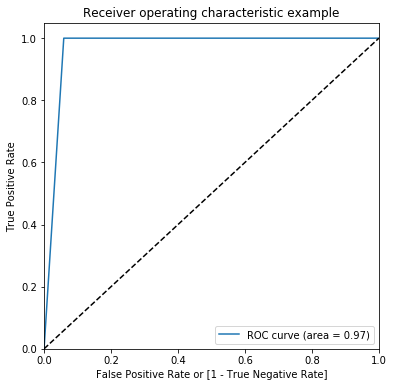

(array([0.        , 0.05882353, 1.        ]),
 array([0., 1., 1.]),
 array([2, 1, 0]))

In [220]:
draw_roc(y_pred_final2.Outcome, y_pred_final2.predicted2)

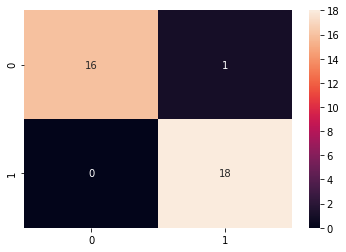

In [221]:
sns.heatmap(confusion_matrix(y_pred_final2.Outcome, y_pred_final2.predicted2), annot = True)
plt.show()

In [222]:
print(classification_report(y_pred_final.Outcome, y_pred_final.predicted2))

              precision    recall  f1-score   support

           0       0.67      0.33      0.44         6
           1       0.88      0.97      0.92        30

    accuracy                           0.86        36
   macro avg       0.77      0.65      0.68        36
weighted avg       0.84      0.86      0.84        36



In [223]:
print(classification_report(y_pred_final2.Outcome, y_pred_final2.predicted2))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97        17
           1       0.95      1.00      0.97        18

    accuracy                           0.97        35
   macro avg       0.97      0.97      0.97        35
weighted avg       0.97      0.97      0.97        35

